<table width=100%>
<tr>
    <td><h1 style="text-align: left; font-size:300%;">
        Mice Protein Expression
    </h1></td>
    <td width="20%">
    <div style="text-align: right">
    <b> Machine Learning</b> <br>  <b>AY 2021/2022</b> <br>
    Emanuele Cavalleri<br>(matriculation number: <b>995883</b>)<br>
    <a href="mailto:emanuele.cavalleri@mail.polimi.it">emanuele.cavalleri@mail.polimi.it</a><br>
    <a href="https://github.com/emanuelecavalleri/MiceProteinExpression">GitHub link for this project</a><br>
    </div>
</tr>
</table>

The data set consists of the **expression levels of $77$ proteins/protein modifications that produced detectable signals in the nuclear fraction of cortex**. There are $38$ control mice and $34$ trisomic mice (Down syndrome), for a total of $72$ mice. In the experiments, $15$ measurements were registered of each protein per sample/mouse. Therefore, for control mice, there are $38x15$, or $570$ measurements, and for trisomic mice, there are $34x15$, or $510$ measurements. The dataset contains a total of $1080$ measurements per protein. Each measurement can be considered as an **independent** sample/mouse.

The eight classes of mice are described based on features such as **genotype**, **behavior** and **treatment**. According to genotype, mice can be **control** or **trisomic**. According to behavior, some mice have been stimulated to learn (**context-shock**) and others have not (**shock-context**) and in order to assess the effect of the drug **memantine** in recovering the ability to learn in trisomic mice, some mice have been injected with the drug and others have not.

**Classes**:
- **c-CS-s**: control mice, stimulated to learn, injected with saline ($9$ mice)
- **c-CS-m**: control mice, stimulated to learn, injected with memantine ($10$ mice)
- **c-SC-s**: control mice, not stimulated to learn, injected with saline ($9$ mice)
- **c-SC-m**: control mice, not stimulated to learn, injected with memantine ($10$ mice)<br><br>
- **t-CS-s**: trisomy mice, stimulated to learn, injected with saline ($7$ mice)
- **t-CS-m**: trisomy mice, stimulated to learn, injected with memantine ($9$ mice)
- **t-SC-s**: trisomy mice, not stimulated to learn, injected with saline ($9$ mice)
- **t-SC-m**: trisomy mice, not stimulated to learn, injected with memantine ($9$ mice)

<img src="https://journals.plos.org/plosone/article/figure/image?size=large&id=10.1371/journal.pone.0129126.g001" alt="Classes of mice"> 
 
Higuera C, Gardiner KJ, Cios KJ (2015) <i>Self-Organizing Feature Maps Identify Proteins Critical to Learning in a Mouse Model of Down Syndrome.</i> PLoS ONE 10(6): e0129126. [<a href="https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0129126">Web Link</a>] journal.pone.0129126 

The aim of this machine learning project is to solve a **clustering** task starting from this dataset identifying subsets of proteins that are discriminant between the classes (i. e., find structures in the data that allow samples from different classes to be easily identified) and to compare the performance of different clustering algorithms using appropriate clustering metrics. 

# Dependencies

In [1]:
%%capture

from matplotlib import gridspec 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
%matplotlib inline

from mpl_toolkits.mplot3d import Axes3D

import random

import math

import sys

import numpy as np 
np.random.seed(0)

import pandas as pd

import seaborn as sns

from collections import OrderedDict

import sklearn
from sklearn.preprocessing import StandardScaler, MinMaxScaler, normalize
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN, OPTICS, cluster_optics_dbscan 
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import pairwise_distances, silhouette_score
from sklearn.model_selection import GridSearchCV

!{sys.executable} -m pip install scikit-learn-extra
from sklearn_extra.cluster import KMedoids

!{sys.executable} -m pip install sklearn_som
from sklearn_som.som import SOM

# Load and describe data

In [2]:
# Read the data and create a Pandas DataFrame
url = "https://raw.githubusercontent.com/emanuelecavalleri/MiceProteinExpression/main/Data_Cortex_Nuclear.xls"
df = pd.read_excel(url)

# Dataframe's dimensions
df.shape

(1080, 82)

In [3]:
# Print the first few (5 by default) rows of the dataset
df.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


From the original paper we can retrieve <b>Attribute Information</b>:

- $1$ <b><i>Mouse ID</i></b>
- {$2, ..., 78$ } <b><i>Values of expression levels of $77$ proteins</i></b>; the names of proteins are followed by <i>_N</i> indicating that they were measured in the nuclear fraction. For example: <i>DYRK1A_N</i>
- $79$ <b><i>Genotype</i></b>: <i>control (c)</i> or <i>trisomy (t)</i>
- $80$ <b><i>Treatment type</i></b>: <i>memantine (m)</i> or <i>saline (s)</i>
- $81$ <b><i>Behavior</i></b>: <i>context-shock (CS)</i> or <i>shock-context (SC)</i>
- $82$ <b><i>Class</i></b>: <i>c-CS-s</i>, <i>c-CS-m</i>, <i>c-SC-s</i>, <i>c-SC-m</i>, <i>t-CS-s</i>, <i>t-CS-m</i>, <i>t-SC-s</i>, <i>t-SC-m</i> 

Boxplots for the expression of three proteins well-known to be differentially expressed in SC and CS according to the original paper:

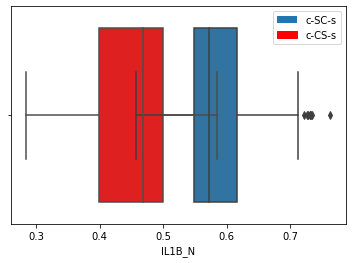

In [4]:
_ = sns.boxplot(x=df.IL1B_N[df['class']=="c-SC-s"])
_ = sns.boxplot(x=df.IL1B_N[df['class']=="c-CS-s"], color='r')
m_patch = mpatches.Patch(label='c-SC-s')
b_patch = mpatches.Patch(color='r', label='c-CS-s')
_ = plt.legend(handles=[m_patch, b_patch], loc='upper right')

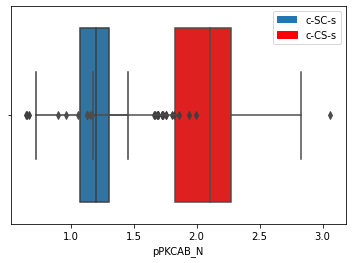

In [5]:
_ = sns.boxplot(x=df.pPKCAB_N[df['class']=="c-SC-s"])
_ = sns.boxplot(x=df.pPKCAB_N[df['class']=="c-CS-s"], color='r')
m_patch = mpatches.Patch(label='c-SC-s')
b_patch = mpatches.Patch(color='r', label='c-CS-s')
_ = plt.legend(handles=[m_patch, b_patch], loc='upper right')

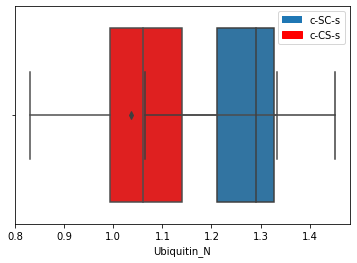

In [6]:
_ = sns.boxplot(x=df.Ubiquitin_N[df['class']=="c-SC-s"])
_ = sns.boxplot(x=df.Ubiquitin_N[df['class']=="c-CS-s"], color='r')
m_patch = mpatches.Patch(label='c-SC-s')
b_patch = mpatches.Patch(color='r', label='c-CS-s')
_ = plt.legend(handles=[m_patch, b_patch], loc='upper right')

Overview of the dataset's statistics:

In [7]:
df.describe(include='all')

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
count,1080,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000,1080,1080,1080,1080
unique,1080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2,2,2,8
top,3605_12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Control,Memantine,S/C,c-CS-m
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,570,570,555,150
mean,NaN,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,...,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784,NaN,NaN,NaN,NaN
std,NaN,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,...,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126,NaN,NaN,NaN,NaN
min,NaN,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,...,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479,NaN,NaN,NaN,NaN
25%,NaN,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,...,0.113506,0.398082,0.125848,0.155121,0.165143,1.081423,NaN,NaN,NaN,NaN
50%,NaN,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,...,0.126523,0.448459,0.158240,0.174935,0.193994,1.317441,NaN,NaN,NaN,NaN
75%,NaN,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,...,0.143652,0.490773,0.197876,0.204542,0.235215,1.585824,NaN,NaN,NaN,NaN


Since <i>MouseID</i> has $1080$/$1080$ unique values, we will use it as index.

In [8]:
df = pd.read_excel(url, index_col='MouseID')

Unfortunately, some columns do not have $1080$ non-null values.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1080 entries, 309_1 to J3295_15
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   DYRK1A_N         1077 non-null   float64
 1   ITSN1_N          1077 non-null   float64
 2   BDNF_N           1077 non-null   float64
 3   NR1_N            1077 non-null   float64
 4   NR2A_N           1077 non-null   float64
 5   pAKT_N           1077 non-null   float64
 6   pBRAF_N          1077 non-null   float64
 7   pCAMKII_N        1077 non-null   float64
 8   pCREB_N          1077 non-null   float64
 9   pELK_N           1077 non-null   float64
 10  pERK_N           1077 non-null   float64
 11  pJNK_N           1077 non-null   float64
 12  PKCA_N           1077 non-null   float64
 13  pMEK_N           1077 non-null   float64
 14  pNR1_N           1077 non-null   float64
 15  pNR2A_N          1077 non-null   float64
 16  pNR2B_N          1077 non-null   float64
 17  pPKCAB_N   

,Total_number_of_missing_values,Percent_of_missing_values
BCL2_N,285,0.263889
H3MeK4_N,270,0.250000
BAD_N,213,0.197222
EGR1_N,210,0.194444
H3AcK18_N,180,0.166667


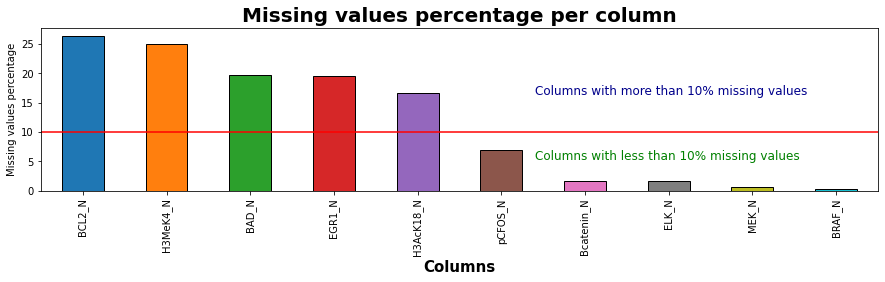

In [10]:
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing = pd.concat([total, percent], axis=1, keys=['Total_number_of_missing_values',
                                                    'Percent_of_missing_values'])

def missing_data(data, thresh=1, color='black', edgecolor='black', width=15, height=3):
     
    plt.figure(figsize=(width,height))
    percentage=(data.isnull().mean())*100
    percentage.sort_values(ascending=False)[:10].plot.bar(color=color, edgecolor=edgecolor)
    plt.axhline(y=thresh, color='r', linestyle='-')
    plt.title('Missing values percentage per column', fontsize=20, weight='bold' )
    plt.text(len(data.isnull()[:10].sum()/len(data))/15, thresh +8, 
             f'Columns with more than {thresh}% missing values', fontsize=12, color='darkblue',
             ha='left' ,va='top')
    plt.text(len(data.isnull()[:10].sum()/len(data))/15, thresh -3, 
             f'Columns with less than {thresh}% missing values', fontsize=12, color='green',
             ha='left' ,va='top')
    plt.xlabel('Columns', size=15, weight='bold')
    plt.ylabel('Missing values percentage')

missing_data(df, 10, color=sns.color_palette())

missing.head()

A $10$% threshold for missing values is depicted by the red line: since we have $5$ columns with more than $10$% missing values, we will drop them from the dataframe.

In [11]:
df = df.dropna(how='any',axis=1,thresh=df.shape[0]*0.9)

# Check new dataframe's shape
df.shape

(1080, 76)

Now we have to make decision what actions to take with the remaining variables still containing missing values: first step will be to sort the variables by the number/percentage of their missing values in descending order.

,Total_number_of_missing_values,Percent_of_missing_values
pCFOS_N,75,0.069444
Bcatenin_N,18,0.016667
ELK_N,18,0.016667
MEK_N,7,0.006481
AMPKA_N,3,0.002778


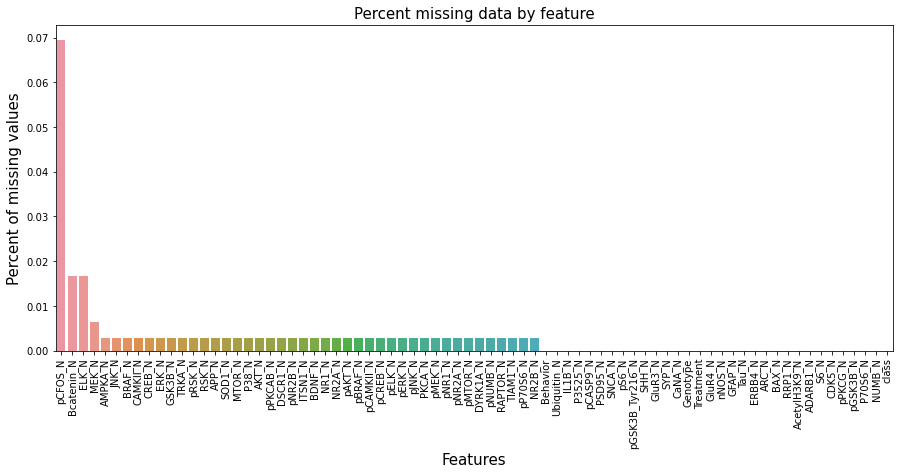

In [12]:
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total_number_of_missing_values',
                                                         'Percent_of_missing_values'])
f, ax = plt.subplots(figsize=(15, 6))
plt.xticks(rotation='90')
sns.barplot(x=missing_data.index, y=missing_data['Percent_of_missing_values'])
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percent of missing values', fontsize=15)
plt.title('Percent missing data by feature', fontsize=15)

missing_data.head()

First three are below described:

In [13]:
df['pCFOS_N'].describe()

count    1005.000000
mean        0.131053
std         0.023863
min         0.085419
25%         0.113506
50%         0.126523
75%         0.143652
max         0.256529
Name: pCFOS_N, dtype: float64

In [14]:
df['ELK_N'].describe()

count    1062.000000
mean        1.173400
std         0.335786
min         0.497695
25%         0.944435
50%         1.096186
75%         1.323581
max         2.802948
Name: ELK_N, dtype: float64

In [15]:
df['Bcatenin_N'].describe()

count    1062.000000
mean        2.146550
std         0.435742
min         1.134886
25%         1.826707
50%         2.114769
75%         2.423875
max         3.680552
Name: Bcatenin_N, dtype: float64

We decide to replace null values in the variables with their respective median, shown as $50$% in `describe()`.

In [16]:
df = df.fillna(df.median())

# Check all is fine
df.isnull().sum().sum()

0

Next, we will check if there is any duplicate data in our dataset.

In [17]:
print(df[df.duplicated()])

Empty DataFrame
Columns: [DYRK1A_N, ITSN1_N, BDNF_N, NR1_N, NR2A_N, pAKT_N, pBRAF_N, pCAMKII_N, pCREB_N, pELK_N, pERK_N, pJNK_N, PKCA_N, pMEK_N, pNR1_N, pNR2A_N, pNR2B_N, pPKCAB_N, pRSK_N, AKT_N, BRAF_N, CAMKII_N, CREB_N, ELK_N, ERK_N, GSK3B_N, JNK_N, MEK_N, TRKA_N, RSK_N, APP_N, Bcatenin_N, SOD1_N, MTOR_N, P38_N, pMTOR_N, DSCR1_N, AMPKA_N, NR2B_N, pNUMB_N, RAPTOR_N, TIAM1_N, pP70S6_N, NUMB_N, P70S6_N, pGSK3B_N, pPKCG_N, CDK5_N, S6_N, ADARB1_N, AcetylH3K9_N, RRP1_N, BAX_N, ARC_N, ERBB4_N, nNOS_N, Tau_N, GFAP_N, GluR3_N, GluR4_N, IL1B_N, P3525_N, pCASP9_N, PSD95_N, SNCA_N, Ubiquitin_N, pGSK3B_Tyr216_N, SHH_N, pS6_N, pCFOS_N, SYP_N, CaNA_N, Genotype, Treatment, Behavior, class]
Index: []

[0 rows x 76 columns]


Let's now visualize the distribution of categorical variables. <i>Genotype</i>, <i>Treatment</i> and <i>Behavior</i> all have two unique values.

Control    570
Ts65Dn     510
Name: Genotype, dtype: int64


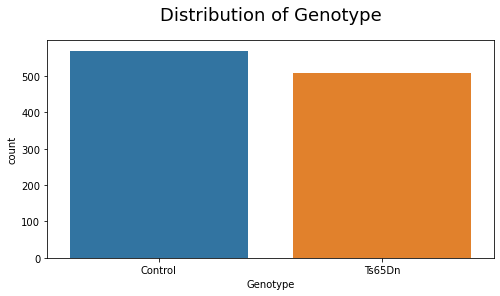

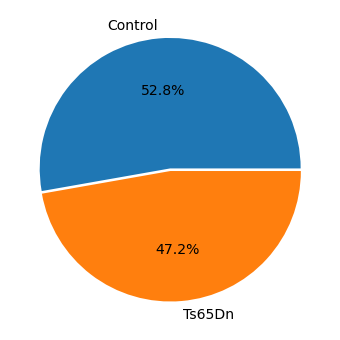

In [18]:
print(df['Genotype'].value_counts())

plt.figure(figsize=(8, 4)) 
ax = sns.countplot(x='Genotype',data=df)
_ = ax.set_title('Distribution of Genotype', fontsize=18, pad=20)

plt.figure(figsize=(13, 6))
_ = plt.pie(df['Genotype'].value_counts(), autopct='%1.1f%%', textprops={'fontsize': 14},
            labels=['Control','Ts65Dn'], explode=[0.01,0.01])

Memantine    570
Saline       510
Name: Treatment, dtype: int64


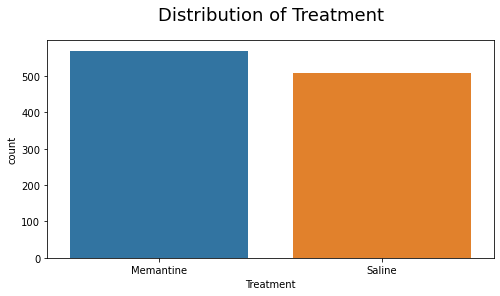

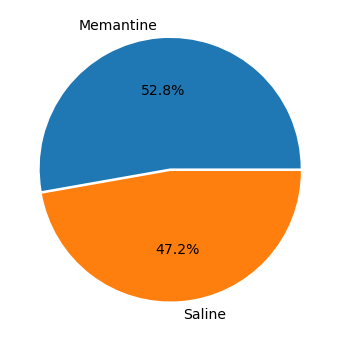

In [19]:
print(df['Treatment'].value_counts())

plt.figure(figsize=(8, 4)) 
ax = sns.countplot(x='Treatment',data=df)
_ = ax.set_title('Distribution of Treatment', fontsize=18, pad=20)

plt.figure(figsize=(13, 6))
_ = plt.pie(df['Treatment'].value_counts(), autopct='%1.1f%%', textprops={'fontsize': 14},
            labels=['Memantine','Saline'], explode=[0.01,0.01])

S/C    555
C/S    525
Name: Behavior, dtype: int64


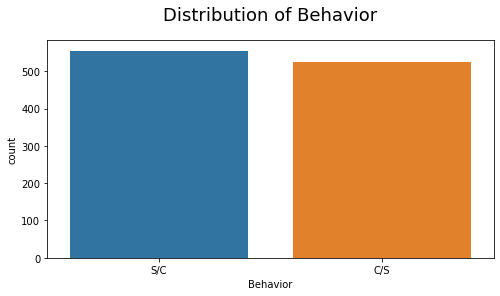

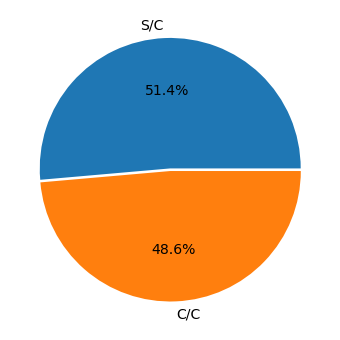

In [20]:
print(df['Behavior'].value_counts())

plt.figure(figsize=(8, 4)) 
ax = sns.countplot(x='Behavior',data=df, order = df['Behavior'].value_counts().index)
_ = ax.set_title('Distribution of Behavior', fontsize=18, pad=20)

plt.figure(figsize=(13, 6))
_ = plt.pie(df['Behavior'].value_counts(), autopct='%1.1f%%', textprops={'fontsize': 14},
            labels=['S/C','C/C'], explode=[0.01,0.01])

<i>class</i> has eight unique values.

c-CS-m    150
c-SC-m    150
c-SC-s    135
t-SC-s    135
c-CS-s    135
t-CS-m    135
t-SC-m    135
t-CS-s    105
Name: class, dtype: int64


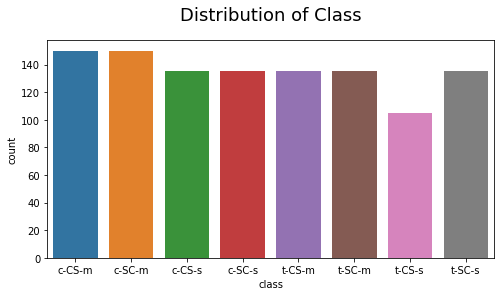

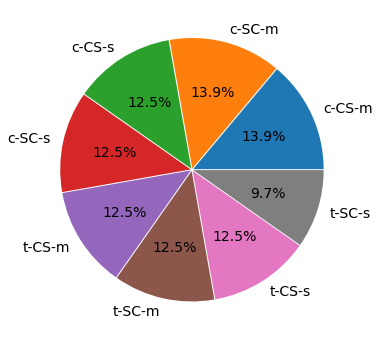

In [21]:
print(df['class'].value_counts())

plt.figure(figsize=(8, 4)) 
ax = sns.countplot(x='class',data=df)
_ = ax.set_title('Distribution of Class', fontsize=18, pad=20)

plt.figure(figsize=(13, 6))
_ = plt.pie(df['class'].value_counts(), autopct='%1.1f%%', textprops={'fontsize': 14},
            labels=['c-CS-m','c-SC-m', 'c-CS-s', 'c-SC-s', 't-CS-m', 't-SC-m', 't-CS-s','t-SC-s'],
            explode=np.repeat([0.01], 8))

As stated in the introduction retrieved from the paper, all classes are almost equally represented.

Let's properly encode categorical columns.

In [22]:
df['class']=df['class'].map({'c-CS-m':0,'c-CS-s':1,'c-SC-m':2,'c-SC-s':3,
                             't-CS-m':4, 't-CS-s':5,'t-SC-m':6,'t-SC-s':7})

# Dummy variables (one-hot encoding)
df = pd.get_dummies(data=df,columns=["Treatment","Behavior", "Genotype"])

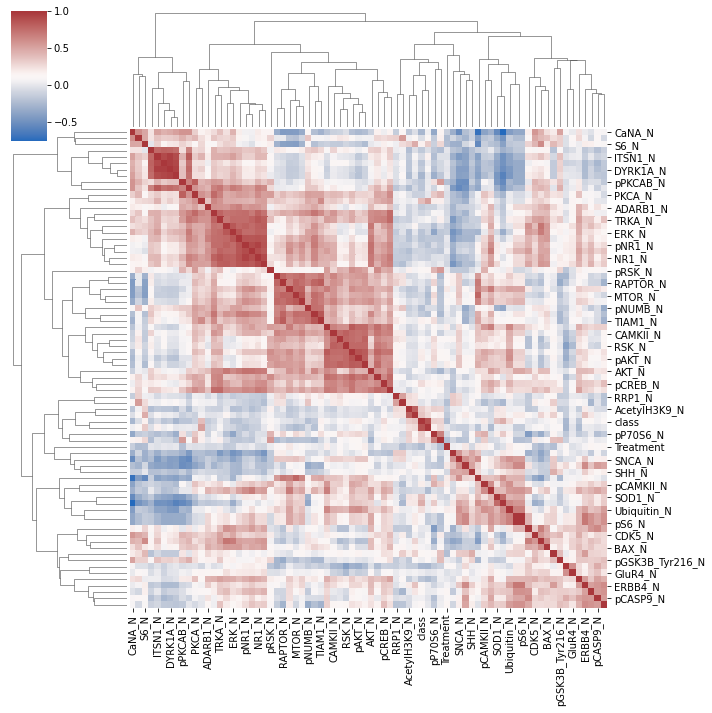

In [23]:
# Just for ease of visualization
df1 = df.drop(columns=["Treatment_Saline","Behavior_C/S", "Genotype_Control"])
df1.rename(columns={'Treatment_Memantine': 'Treatment', 'Behavior_S/C': 'Behavior',
                    'Genotype_Ts65Dn': 'Genotype'}, inplace=True)

# Clustermap
_ = sns.clustermap(df1.corr(),cmap='vlag')

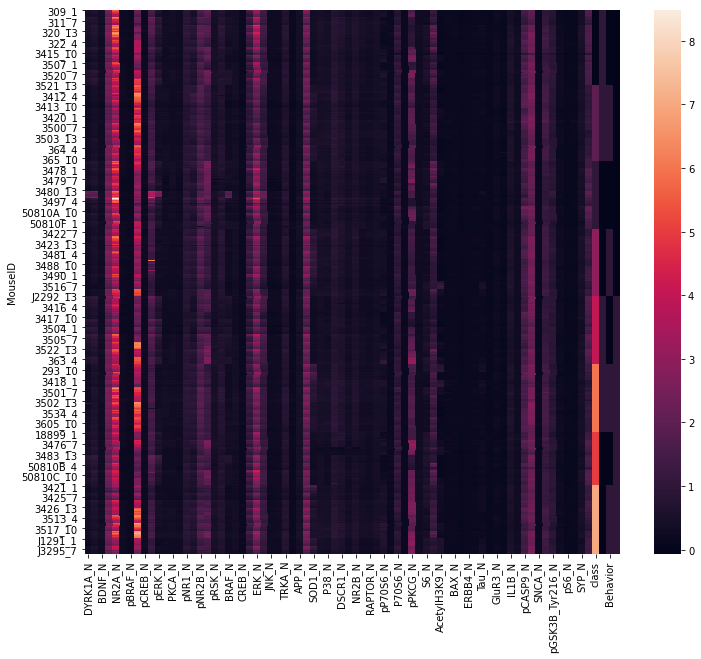

In [24]:
# Heatmap
plt.figure(figsize=(12,10))
_ = sns.heatmap(df1)

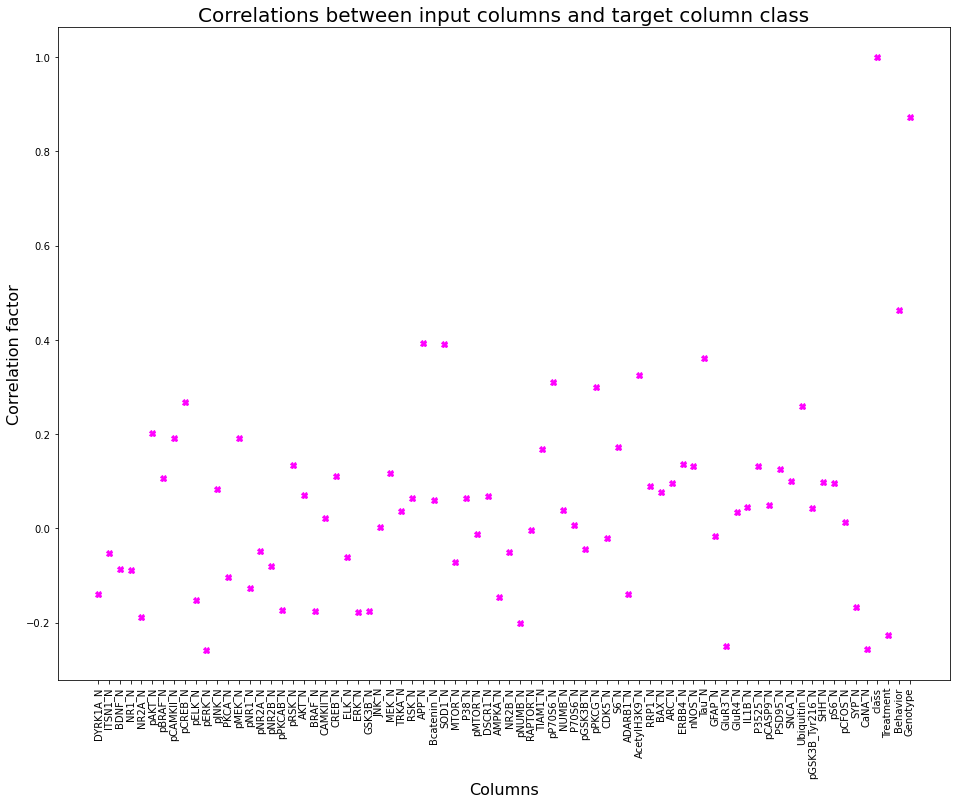

In [25]:
autcorr = df1.corr()["class"]
plt.figure(figsize = (16, 12))
plt.title("Correlations between input columns and target column class", fontsize = 20)
plt.xlabel("Columns", fontsize = 16)
plt.xticks(rotation = 90) # X axis' rotation = 90°
plt.ylabel("Correlation factor", fontsize = 16)
plt.plot(autcorr, color = "magenta", linestyle = "", marker = "X")
plt.show()

In [26]:
df1.corr()['class'].abs().sort_values(ascending=False)

class       1.000000
Genotype    0.873204
Behavior    0.462728
APP_N       0.394009
SOD1_N      0.390152
              ...   
pCFOS_N     0.012879
pMTOR_N     0.012015
P70S6_N     0.006807
RAPTOR_N    0.003622
JNK_N       0.003213
Name: class, Length: 76, dtype: float64

As one could expect, <i>Genotype</i> is the highest positively correlated feature with the outcome.

Keeping this information in mind, we prepare the dataset to apply clustering algorithms and models: first step is to split the dataframe into independent variables and target data.

In [27]:
x=df.drop(columns=['class'])
y=df['class'].astype("category")

To prepare the dataframe <i>x</i> for further processing, we will scale the data using the `MinMaxScaler` imported from the `sklearn` library.

In [28]:
df_scaled = pd.DataFrame(MinMaxScaler().fit_transform(x), columns=x.columns, index=x.index)
df_scaled.head()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,pS6_N,pCFOS_N,SYP_N,CaNA_N,Treatment_Memantine,Treatment_Saline,Behavior_C/S,Behavior_S/C,Genotype_Control,Genotype_Ts65Dn
MouseID,,,,,,,,,,,,,,,,,,,,,
309_1,0.151122,0.212885,0.824638,0.612119,0.630482,0.327006,0.448666,0.168257,0.617322,0.232553,...,0.426816,0.133930,0.336299,0.705738,1.0,0.0,1.0,0.0,1.0,0.0
309_2,0.155750,0.188226,0.776455,0.601070,0.585247,0.311887,0.429899,0.154925,0.590173,0.205362,...,0.429952,0.110434,0.365208,0.749771,1.0,0.0,1.0,0.0,1.0,0.0
309_3,0.153459,0.205696,0.793572,0.558911,0.575910,0.306369,0.441381,0.153485,0.607102,0.199194,...,0.448652,0.121560,0.353621,0.868229,1.0,0.0,1.0,0.0,1.0,0.0
309_4,0.125169,0.157688,0.637326,0.468152,0.480646,0.335530,0.444307,0.132074,0.486945,0.205135,...,0.392700,0.151031,0.265619,0.721879,1.0,0.0,1.0,0.0,1.0,0.0
309_5,0.122146,0.157838,0.637787,0.426467,0.441977,0.314976,0.433100,0.129086,0.410194,0.189152,...,0.410187,0.147711,0.350381,0.812053,1.0,0.0,1.0,0.0,1.0,0.0


We will use this dataframe for building our ML models for clustering.

# Dimensionality reduction - Principal Component Analysis (PCA)

**Dimensionality reduction** algorithms capture/extract the most important information in the original data while reducing the size of the dataset. **PCA** is one of the possible unsupervised techniques to perform dimensionality reduction.

We can try to have a first idea of how samples are organized by visualizing how they are distributed in the space. We will use PCA to convert the original dataset features (75) into **3 new features** and use them as coordinates of a 3D space.

Let's start with the non-scaled dataset, just to see how the scaling results meaningful.

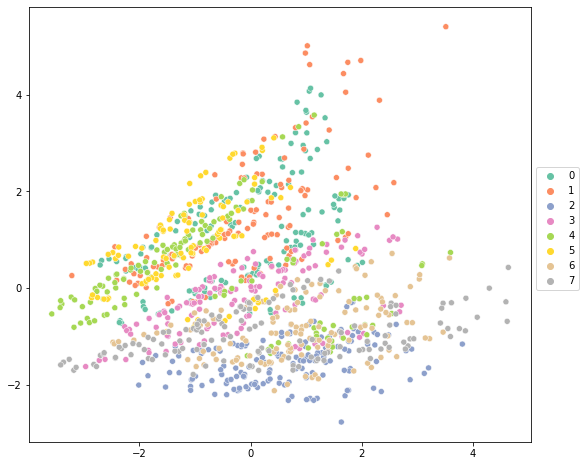

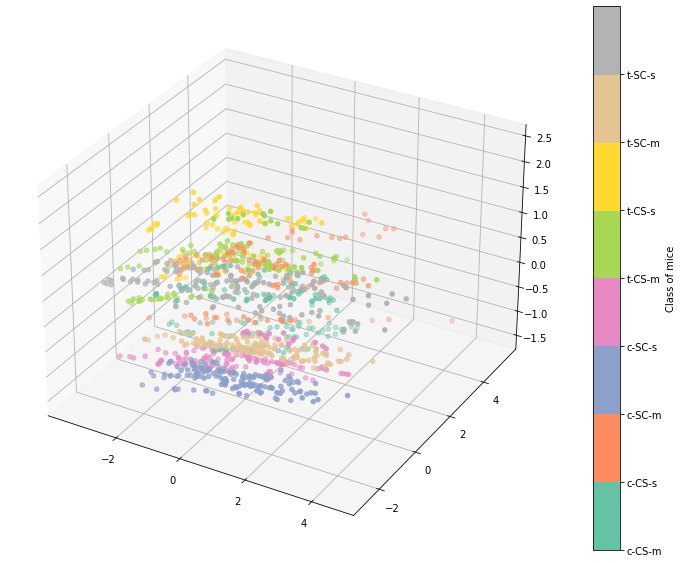

In [29]:
def plot_3d(X, labels, classes):
    pca = PCA()
    X = pca.fit_transform(X)
    
    unique_labels = np.unique(labels)
    nlabels = len(unique_labels)
    
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define color mappings
    cmap = plt.cm.get_cmap('Set2')
    smap = cm.ScalarMappable(
              norm=mcolors.Normalize(unique_labels.min(), unique_labels.max()+1), 
              cmap=cmap)
    # Plot the 3d coordinates
    ax.scatter(xs=X[:, 0], ys=X[:, 1], zs=X[:, 2], c=labels, cmap=cmap)
    # Plot a color bar on the right
    cbar = plt.colorbar(mappable=smap, label='Class of mice', ticks=range(nlabels))
    cbar.ax.set_yticklabels(classes)
    
# Plot2d
pca = PCA().fit_transform(x)
fig = plt.figure(figsize=(9,8))
sns.scatterplot(x=pca[:,0],y=pca[:,1],hue=y,palette="Set2");
plt.legend(loc=(1.01,0.35));

plot_3d(x, y, ['c-CS-m','c-CS-s','c-SC-m','c-SC-s','t-CS-m','t-CS-s','t-SC-m','t-SC-s'])

Patterns are not clearly visible, we can only recognize horizontal "lines" depicted by the same color. Let's switch to the scaled dataset.

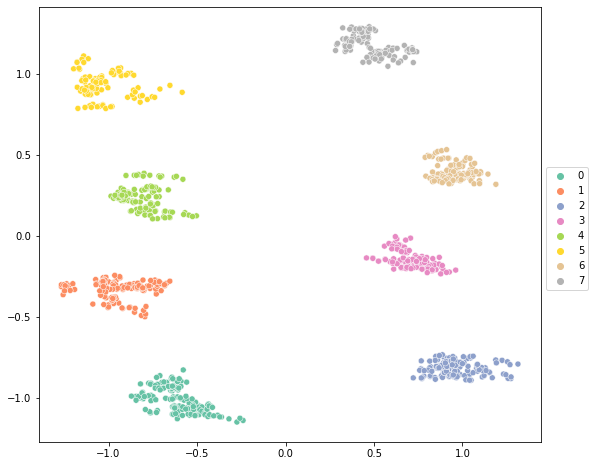

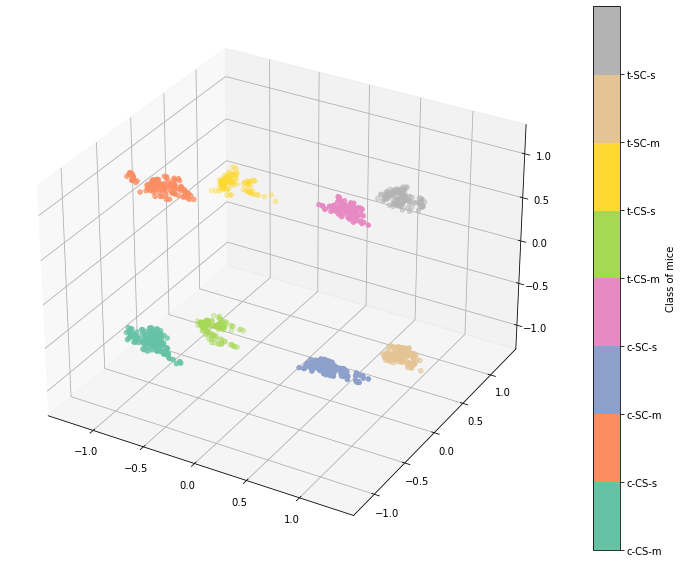

In [30]:
pca = PCA().fit_transform(df_scaled)
fig = plt.figure(figsize=(9,8))
sns.scatterplot(x=pca[:,0],y=pca[:,1],hue=y,palette="Set2");
plt.legend(loc=(1.01,0.35));

plot_3d(df_scaled, y, ['c-CS-m','c-CS-s','c-SC-m','c-SC-s','t-CS-m','t-CS-s','t-SC-m','t-SC-s'])

Scaling data we can clearly recognize eight well-defined clusters:
- Samples of the same class seem to aggregate in close regions of the space.
- Different classes seem to be well separated.
- Similar classes (SC and CS) tend to be located in close regions of the space (SC classes - numbered $2$, $3$ $6$ and $7$ - on the right side of the 2D and 3D plots, CS classes - numbered $0$, $1$, $4$, $5$ - on the left side of it).

These observations let us conclude that a good clustering algorithm, properly tuned, should be able to accurately reconstruct the original clusters.

To conclude this section we plot the explained variance ratio.

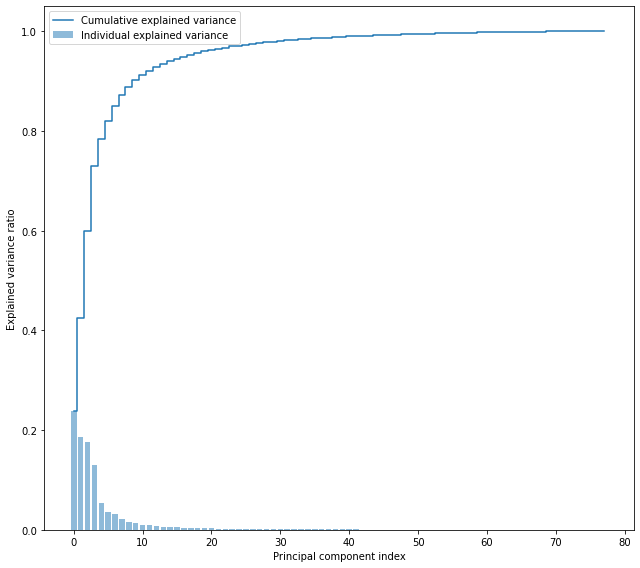

In [31]:
pca = PCA()
pca.fit_transform(df_scaled)

exp_var_pca = pca.explained_variance_ratio_

# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

fig = plt.figure(figsize=(9,8))
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

With $3$ components (represented by the three axis in the 3D plot) we explain the

In [32]:
print("{:.0f}%".format(cum_sum_eigenvalues[3] * 100))

73%


of the original variance.

# Hierarchical Clustering

**Hierarchical clustering** (or **Agglomerative clustering**) is a clustering technique that works by partitioning the points iteratively. A **bottom-up** approach starts by considering singleton clusters (i.e., clusters containing only one sample) and then iteratively merges together the two most similar clusters.

This iterative approach, while in some cases less efficient, allows us to reconstruct the sequence of merges and to build a hierarchy of clusters which is usually called **dendrogram**.

**NOTE:** we chose to identify nodes by negative numbers: $-1$ is the last merge, $-2$ is the last but one merge and so on.

## Linkage methods for building the linkage matrix

Given a set of clusters, we have different options to decide which of them to merge first. There are multiple strategies to decide, the best one often depend on the dataset (we will see each of them).

- **Complete** (maximal intercluster distance): compute all distances between points in cluster A and cluster B and return the *largest of these distances*.
- **Single** (minimal intercluster distance): as before, but we return the *smallest distance*.
- **Average/Median** (mean intercluster distance): as before, but we return the *average/median of the distances*.
- **Centroid**: we compute the distance of the two clusters as the distance between the two clusters means/centroids.
- **Ward** (minimal inter-cluster variance): finds the pair of clusters that leads to *minimum increase in total within-cluster variance after merging*.

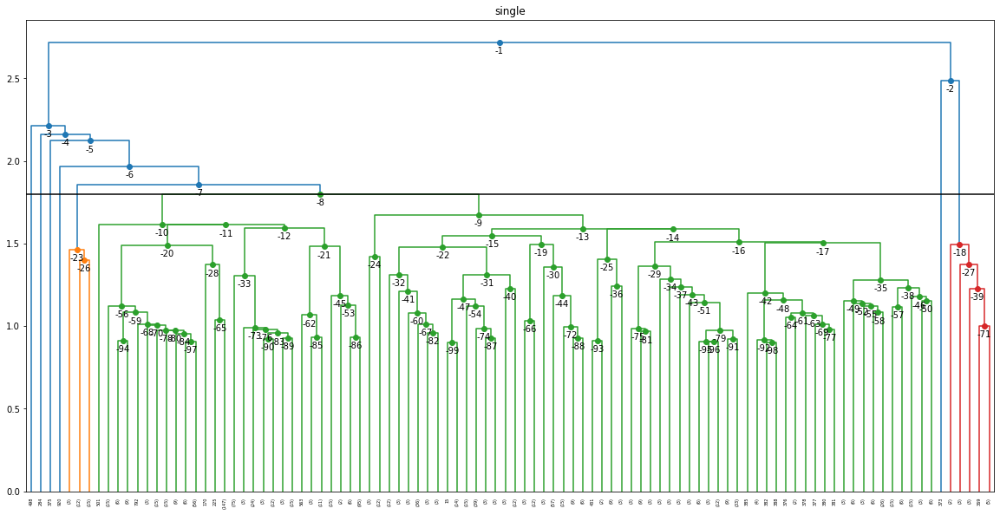

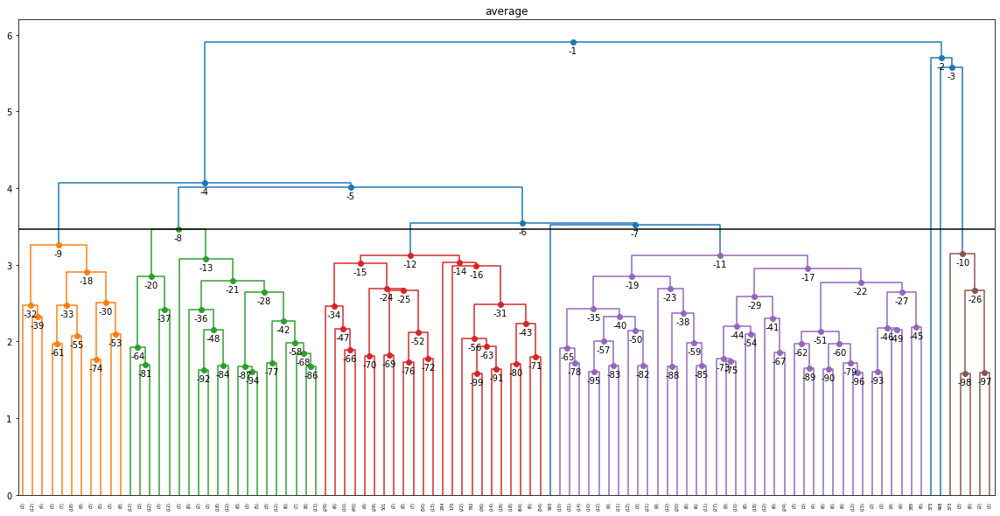

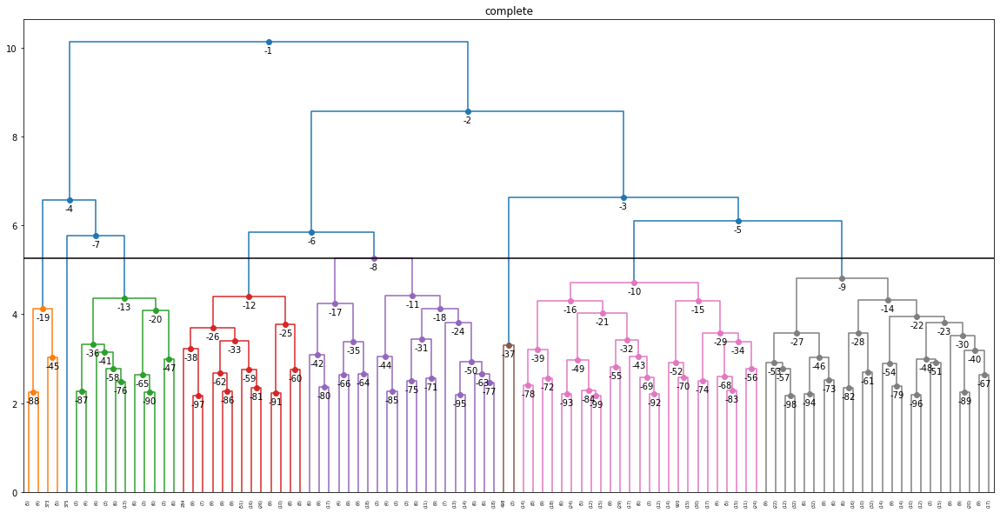

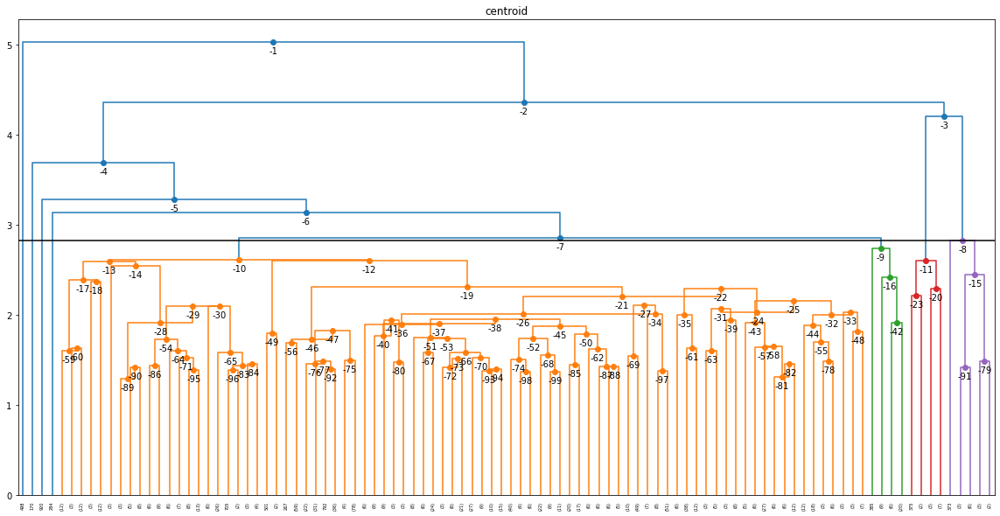

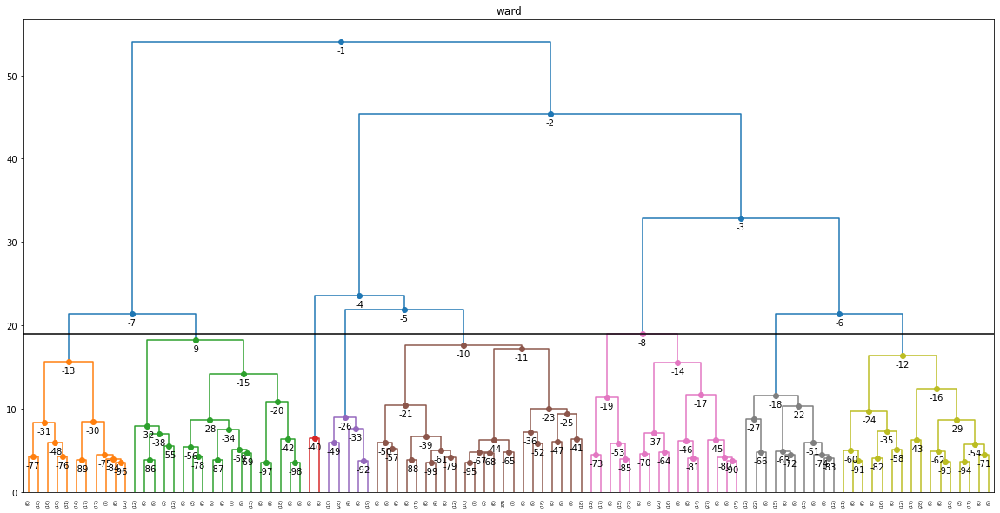

In [33]:
def plot_dendrogram(Z=None, model=None, X=None, **kwargs):
    annotate_above = kwargs.pop('annotate_above', 0)

    # Reconstruct the linkage matrix if the standard model API was used
    if Z is None:
        if hasattr(model, 'distances_') and model.distances_ is not None:
            # create the counts of samples under each node
            counts = np.zeros(model.children_.shape[0])
            n_samples = len(model.labels_)
            for i, merge in enumerate(model.children_):
                current_count = 0
                for child_idx in merge:
                    if child_idx < n_samples:
                        current_count += 1  # leaf node
                    else:
                        current_count += counts[child_idx - n_samples]
                counts[i] = current_count

            Z = np.column_stack([model.children_, model.distances_,
                                              counts]).astype(float)
        else:
            Z = linkage(X, method=model.linkage, metric=model.affinity)
    
    if 'n_clusters' in kwargs:
        n_clusters = kwargs.pop('n_clusters')
        # Set the cut point just above the last but 'n_clusters' merge
        kwargs['color_threshold'] = Z[-n_clusters, 2] + 1e-6
        #kwargs['color_threshold'] = None
    
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(111)
    # Plot the corresponding dendrogram
    ddata = dendrogram(Z, ax=ax, **kwargs)
    
    # Annotate nodes in the dendrogram
    for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
        x = 0.5 * sum(i[1:3])
        y = d[1]
        nid = np.where(Z[:,2] == y)[0][0]
        if y > annotate_above:
            plt.plot(x, y, 'o', c=c)
            plt.annotate(str(nid-Z.shape[0]), (x, y), xytext=(0, -5),
                         textcoords='offset points',
                         va='top', ha='center')
    if kwargs['color_threshold']:
        plt.axhline(y=kwargs['color_threshold'], c='k')
    
    return fig, ax

methods = ['single', 'average', 'complete', 'centroid', 'ward']

for method in methods:
    Z = linkage(x, method=method, metric='euclidean')
    fig, ax = plot_dendrogram(Z=Z, X=df_scaled, truncate_mode='lastp', p=100, n_clusters=8)
    # Plot the dendrogram, showing only the last 100 merges
    # and cutting the dendrogram so that we obtain 8 clusters
    ax.set_title(method)
    plt.plot()

As an alternative we could consider `AgglomerativeClustering` from `sklearn.cluster`. It behaves similarly, but also provides the `fit()` and `predict()` methods.

In [34]:
model = AgglomerativeClustering(n_clusters=8, distance_threshold=None,
                                affinity='euclidean', linkage='ward')

y_predict = model.fit_predict(df_scaled)

As expected:
- **Single** linkage is the one that provides smaller jumps among all.
- **Complete** linkage provides generally larger jumps than single and average.
- **Centroids** linkage may suffer (as in this case) of **inversions**.
- **Ward** is generally very stable (default choice for `scikit-learn`), especially in our specific case.

While the dendrogram is very useful for inspecting the hierarchy and sequence of merges/splits, **it is not very informative if we are not able to determine what are the samples grouped inside each of the clusters**.

However, **using the linkage matrix we can reconstruct the set of points within each cluster**. We can "backtrack" the sequence of merges and reconstruct the list of samples given a linkage row.

In [35]:
# Recursively backtrack the dendrogram, collecting
# the list of sample id starting from an initial point
def get_node_leaves(Z, idx, N):
    n1, n2 = int(Z[idx,0]), int(Z[idx,1])
    leaves = []
    for n in [n1, n2]:
        if n < N:
            leaves += [n]
        else:
            leaves += get_node_leaves(Z, n-N, N)
    return leaves

def plot_node(Z, X, y, idx):
    leaves = get_node_leaves(Z, idx, X.shape[0])
    labels, counts = np.unique(y[leaves], return_counts=True)
    nleaves = len(leaves)
    print(pd.DataFrame(np.array(counts).reshape(1,-1), 
                       columns=labels, index=["Frequency:"]))
    print("Samples in the cluster:", len(leaves), "/", X.shape[0])

# Plot the first node
plot_node(Z, df_scaled, y, -8)

             2   3   6   7
Frequency:  60  53  31  75
Samples in the cluster: 219 / 1080


If we inspect the first merge we obtain samples only from SC classes (numbered $2$, $3$, $6$ and $7$).

Let's try to plot nodes $-12$ and $-18$, which are later merged together.

In [36]:
plot_node(Z, df_scaled, y, -18)

             0   1  4   5
Frequency:  24  45  6  43
Samples in the cluster: 118 / 1080


In [37]:
plot_node(Z, df_scaled, y, -12)

             0  1   4   5
Frequency:  23  3  87  51
Samples in the cluster: 164 / 1080


They refer to samples with class $4$ and $1$ which are very similar to each other (in general to CS clusters, which are classes numbered $0$, $1$, $4$ and $5$).

Node $-94$ is a leaf of $-12$ and is clustered into $5$ (*t-CS-s*).

In [38]:
plot_node(Z, df_scaled, y, -94)

             5
Frequency:  14
Samples in the cluster: 14 / 1080


Hierarchical clustering allows us to identify these structure in data. Because of that, a part from a clustering algorithm, it is also **often used as a visualization technique to inspect datasets**.

# Clustering Metrics

## Cluster validity via correlation

We define the **incidence matrix** as an $N \times N$ matrix (where $N$ is the number of sampes) having a $1$ in position $(i, j)$ if the samples $i$ and $j$ have the same *predicted* cluster id. 

We define the **similarity matrix** as an $N \times N$ matrix containing the similarity ($1 - distance$) between each pair of points.

The **clustering correlation** is defined as the correlation (normalized dot product, or cosine similarity) between these matrices, seen as two vectors.

In [39]:
def incidence_mat(y_pred):
    npoints = y_pred.shape[0]
    mat = np.zeros([npoints, npoints])
    # Retrieve how many different cluster ids there are
    clusters = np.unique(y_pred)
    nclusters = clusters.shape[0]
    
    for i in range(nclusters):
        sample_idx = np.where(y_pred == i) # Indices of the samples in this cluster
        # Compute combinations of these indices
        xx, yy = np.meshgrid(sample_idx, sample_idx)
        mat[xx, yy] = 1
        
    return mat

def similarity_mat(X, metric):
    dist_mat = pairwise_distances(X, metric=metric)
    min_dist, max_dist = dist_mat.min(), dist_mat.max()
    
    # Normalize distances in [0, 1] and compute the similarity
    sim_mat = 1 - (dist_mat - min_dist) / (max_dist - min_dist)
    return sim_mat

def correlation(X, y_pred, metric):
    inc = incidence_mat(y_pred)
    sim = similarity_mat(X, metric)
    
    # Note: we can eventually remove duplicate values
    # only the upper/lower triangular matrix
    # triuidx = np.triu_indices(y_pred.shape[0], k=1)
    # inc = inc[triuidx]
    # sim = sim[triuidx]
    
    inc = normalize(inc.reshape(1, -1))
    sim = normalize(sim.reshape(1, -1))
    corr = inc @ sim.T
    
    return corr[0,0]   

print(correlation(df_scaled, y_predict, 'euclidean'))

0.4882587810923585


**How does it compare with a random clustering?**

In [40]:
y_rand = np.random.randint(0, 8, y.shape[0])
print(correlation(df_scaled, y_rand, 'euclidean'))

0.34745050761549556


To inspect the similarity matrix and take a look at how much points within the same cluster are distant from each other we can resort to a **sorted similarity matrix**.

We compute the similarity matrix (or distance matrix) as usual, and then order rows and columns in such a way that points with the same cluster id are close to each other.

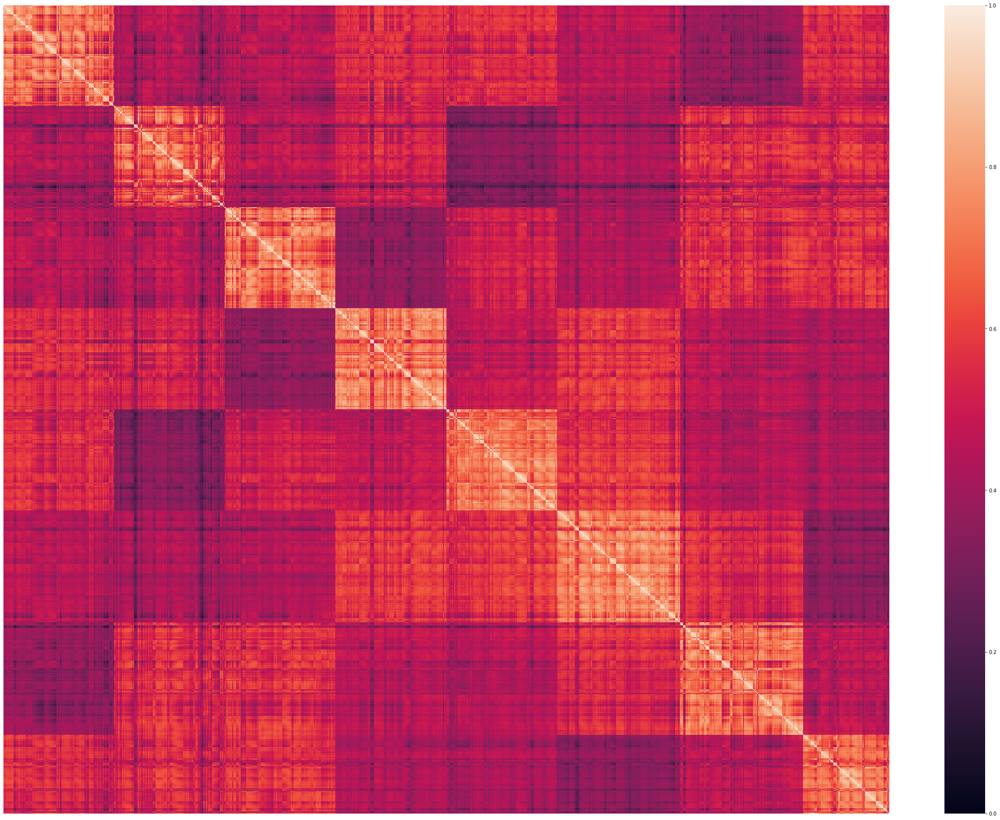

In [41]:
def sorted_mat(sim, y_pred):
    idx_sorted = np.argsort(y_pred)
    # Sort the rows
    sim = sim[idx_sorted,:]
    # Sort the columns
    sim = sim[:, idx_sorted]
    
    return sim

def plot_sorted_mat(sim, y_pred):
    sim = sorted_mat(sim, y_pred)
    
    fig, ax = plt.subplots(figsize=(40,30))  
    ax = sns.heatmap(sim, ax=ax)
    # Remove ruler (ticks)
    ax.set_yticks([]) 
    ax.set_xticks([])
    
sim = similarity_mat(df_scaled, 'euclidean')
plot_sorted_mat(sim, y_predict)

The similarity matrix appears as formed by squares that arrange along the main diagonal.

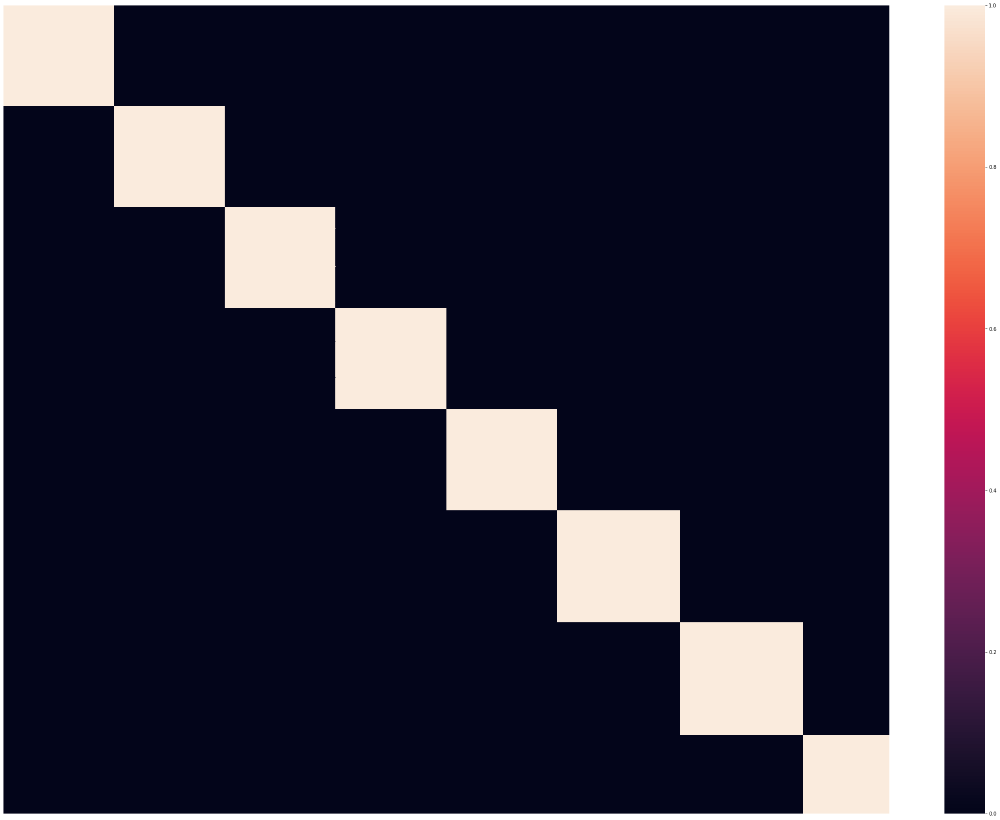

In [42]:
# Incidence matrix
inc = incidence_mat(y_predict)
plot_sorted_mat(inc, y_predict)

Quite similar to similarity matrix, with well-defined squares arranged along the main diagonal, as it should be.

## Deciding the number of clusters

### Dendrogram

The dendrogram shows distances between clusters. We can use this knowledge to decide where to cut. If we see that two cluster were merged despite their distance was very high, we can conclude that that merge was probably not needed.

### Elbow Analysis

Let's suppose we don't know the data very well, how can we determine the correct number of clusters? A common technique is called **elbow analysis** and consists in plotting two metrics **WSS** (**within sum of squares**) and **BSS** (**between sum of squares**).

- **WSS** = Sum of the distances between any pair of points that are in the same cluster.

- **BSS** = Sum of the distances between any pair of points that are in different clusters.

We then search for "elbows" in this graph to decide where to cut.

In [43]:
def wss(X, y_pred, metric):
    # Compute the incidence matrix
    inc = incidence_mat(y_pred)
    # Compute the distances between each pair of nodes
    dist_mat = pairwise_distances(X, metric=metric)
    # Use the incidence matrix to select only the 
    # distances between pair of nodes in the same cluster
    dist_mat = dist_mat * inc
    # Select the lower/upper triangular part of the matrix
    # excluding the diagonal
    triu_idx = np.triu_indices(X.shape[0], k=1)
    
    wss = (dist_mat[triu_idx] ** 2).sum()
    
    return wss

def bss(X, y_pred, metric):
    # Compute the incidence matrix
    inc = incidence_mat(y_pred)
    # Compute the distances between each pair of nodes
    dist_mat = pairwise_distances(X, metric=metric)
    # Use the incidence matrix to select only the 
    # distances between pair of nodes in different clusters
    dist_mat = dist_mat * (1 - inc)
    # Select the lower/upper triangular part of the matrix
    # excluding the diagonal
    triu_idx = np.triu_indices(X.shape[0], k=1)
    
    bss = (dist_mat[triu_idx] ** 2).sum()
    
    return bss


print("WSS", wss(df_scaled, y_predict, 'euclidean'))
print("BSS", bss(df_scaled, y_predict, 'euclidean'))

WSS 160648.55164997795
BSS 3241807.323631704


**Sinlhuette score**: a combination of the two. A silhouette score of $1$ means that the clusters are very dense and nicely separated and have strong cohesion and separation. 

We cut where the silhouette with euclidean distance as metric has its maximum.

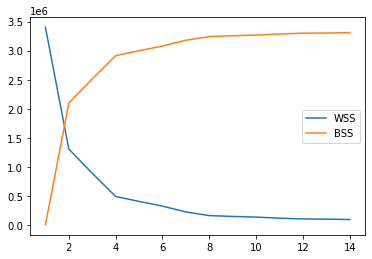

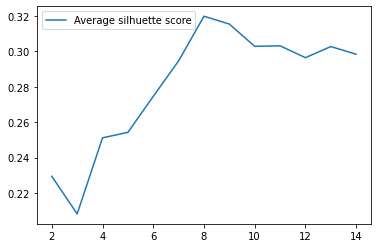

In [44]:
wss_list, bss_list, sil_list = [], [], []
clus_list = list(range(1, 15))

for nc in clus_list:
    model = AgglomerativeClustering(n_clusters=nc,
                                    affinity='euclidean', 
                                    linkage='ward')

    y_predict = model.fit_predict(df_scaled)
    
    wss_list.append(wss(df_scaled, y_predict, 'euclidean'))
    bss_list.append(bss(df_scaled, y_predict, 'euclidean'))
    if nc > 1:
        sil_list.append(silhouette_score(df_scaled, y_predict, metric='euclidean'))
    
_ = plt.plot(clus_list, wss_list, label='WSS')
_ = plt.plot(clus_list, bss_list, label='BSS')
_ = plt.legend()
_ = plt.show()

_ = plt.plot(clus_list[1:], sil_list, label='Average silhuette score')
_ = plt.legend()

In [45]:
model = AgglomerativeClustering(n_clusters=8, distance_threshold=None,
                                affinity='euclidean', linkage='ward')
y_predict = model.fit_predict(df_scaled)

print("Silhoette Coefficient for Agglomerative clustering (K = 8) based on euclidean distance: ")
print(silhouette_score(df_scaled, y_predict, metric='euclidean'))

Silhoette Coefficient for Agglomerative clustering (K = 8) based on euclidean distance: 
0.3197782652626225


As expected:
- **BSS** increases as the number of clusters increases: if all points are in the same cluster we don't have anything to sum, if all points are in different clusters we sum all the distances.
- **WSS** decreases as the number of clusters increases: the behavior is exactly the opposite as BSS.

The silhouette curve is usually more easy to interpret. In this case it confirms us to cut at $8$ clusters.

## Precision, Recall, Purity, Entropy and Jaccard similarity

Metrics defined for classificaton are also defined for clustering. In this case their definition is a little bit different since in clustering we are free to assign cluster ids, it only matters how we split samples, not the cluster id we chose.

**Notice:** we can compute this metrics only if we know the underlying true cluster assignments (as in our case).

In [46]:
def get_Ncounts(y_predict, y_true, k, j=None):
    N = y_true.shape[0]
    Nk_mask = y_predict == k
    Nk = Nk_mask.sum()
    Nj, Nkj = None, None
    if j is not None:
        Nj_mask = y_true == j
        Nj = Nj_mask.sum()
        Nkj = np.logical_and(Nj_mask, Nk_mask).sum()
    return N, Nk, Nj, Nkj

def precision(y_predict, y_true, k, j):
    N, Nk, Nj, Nkj = get_Ncounts(y_predict, y_true, k, j)
    return Nkj / (Nk + 1e-8)
    
def recall(y_predict, y_true, k, j):
    N, Nk, Nj, Nkj = get_Ncounts(y_predict, y_true, k, j)
    return Nkj / (Nj + 1e-8)

def F(y_predict, y_true, k, j):
    p = precision(y_predict, y_true, k, j)
    r = recall(y_predict, y_true, k, j)
    return (2*p*r) / (p+r)

def purity(y_predict, y_true, k):
    cls = np.unique(y_true)
    prec = [precision(y_predict, y_true, k, j) for j in cls]
    return max(prec)

def entropy(y_predict, y_true, k):
    cls = np.unique(y_true)
    prec = [precision(y_predict, y_true, k, j) for j in cls]
    logprec = [math.log2(c) if c !=0 else c for c in prec]
    ek = np.dot(prec, logprec)
    return -ek.sum()

def tot_purity(y_predict, y_true):
    N = y_true.shape[0]
    nc = len(np.unique(y_true))
    p = 0
    for k in range(nc):
        N, Nk, _, _ = get_Ncounts(y_predict, y_true, k)
        pk = purity(y_predict, y_true, k)
        p += (Nk / N) * pk
    return p

def tot_entropy(y_predict, y_true):
    N = y_true.shape[0]
    nc = len(np.unique(y_true))
    e = 0
    for k in range(nc):
        N, Nk, _, _ = get_Ncounts(y_predict, y_true, k)
        ek = entropy(y_predict, y_true, k)
        e += (Nk / N) * ek
    return -e

print("Purity:", tot_purity(y_predict, y))
print("Entropy:", tot_entropy(y_predict, y))

Purity: 0.9999999999259258
Entropy: -1.0686629926485829e-10


We can interpret the purity as a sort of accuracy in classification terms and entropy as somehow its opposite. Herarchical clustering performs excellent.

**How does it compare with a random clustering?** (purity should be lower and entropy closer to $0$).

In [47]:
print("Purity:", tot_purity(y_rand, y))
print("Entropy:", tot_entropy(y_rand, y))

Purity: 0.18240740739385075
Entropy: -2.955230155931268


Computing the Jaccard similarity is a little bit tedious to handle since the true clusters and the predicted ones are labeled with different numbers (but, as we said, it only matters how we split samples, not the cluster id we chose).

In [48]:
pd.unique(y)

[0, 2, 1, 3, 4, 6, 5, 7]
Categories (8, int64): [0, 2, 1, 3, 4, 6, 5, 7]

In [49]:
pd.unique(y_predict)

array([6, 5, 1, 3, 2, 4, 7, 0])

Let's fix this issue. We expect a weighted Jaccard score of 1 since the purity of the clustering is almost equivalent to 1.

In [50]:
y_pred=pd.DataFrame(y_predict)
y_pred=y_pred[0].map({6:0,5:2,1:1,3:3,2:4,4:6,7:5,0:7}).to_numpy()

print(sklearn.metrics.jaccard_score(y, y_pred, average=None))
print(sklearn.metrics.jaccard_score(y, y_pred, average='weighted'))

[1. 1. 1. 1. 1. 1. 1. 1.]
1.0


# KMeans

KMeans is a representative-based clustering algorithm, meaning that, each cluster is always represented by a single point in the feature space. It is an **iterative** algorithm, that incrementally updates and improves the solution, and, unlike hierarchical clustering, it **needs to know in advantage the final number of clusters**.

Predictions are based on the number of centroids present ($K$) and nearest mean values, given an Euclidean Distance measurement between observations.

We already know best $K$ should be $8$, anyway we will use Elbow method to confirm it.

KMeans identifies clusters with particular shapes, namely **ellipses** (or spheres in 3D, and our clusters are definitely like that). KMeans has a number of problems when clusters:
- have different sizes;
- different densities;
- non-globular shapes;
- outliers that do not belong to any cluster.

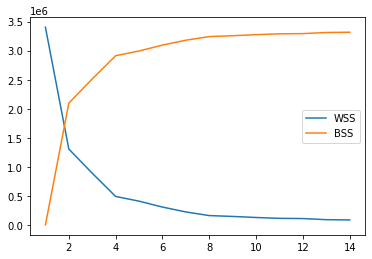

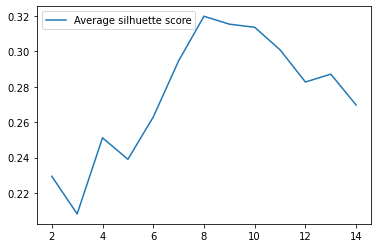

In [51]:
wss_list, bss_list, sil_list = [], [], []
clus_list = list(range(1, 15))

for nc in clus_list:
    model = KMeans(n_clusters=nc, init = 'k-means++', random_state=42)

    y_predict = model.fit_predict(df_scaled)
    
    wss_list.append(wss(df_scaled, y_predict, 'euclidean'))
    bss_list.append(bss(df_scaled, y_predict, 'euclidean'))
    if nc > 1:
        sil_list.append(silhouette_score(df_scaled, y_predict, metric='euclidean'))
    
_ = plt.plot(clus_list, wss_list, label='WSS')
_ = plt.plot(clus_list, bss_list, label='BSS')
_ = plt.legend()
_ = plt.show()

_ = plt.plot(clus_list[1:], sil_list, label='Average silhuette score')
_ = plt.legend()

In [52]:
model = KMeans(n_clusters=8, init='k-means++', random_state=42)         
y_predict = model.fit_predict(df_scaled)

print("Silhoette Coefficient for KMeans clustering (K = 8)  based on euclidean distance: ")
print(silhouette_score(df_scaled, y_predict, metric='euclidean'))

Silhoette Coefficient for KMeans clustering (K = 8)  based on euclidean distance: 
0.3197782652626225


Based on the above we can clearly confirm that the highest Silhouette Score we can get while running Kmeans clustering is reached using $8$ clusters (as one could expect, exactly the number of classes).

## Initialization

KMeans performance greatly depends on the **initial points**. If we start with a cluster point which is far away from the actual points, and close to an outlier, we may end up obtaining a cluster with a single point inside.

Multiple strategies exists:

In [53]:
# Random
model = KMeans(n_clusters=8, init='random', random_state=42)             
print("Random Kmeans purity", tot_purity(model.fit_predict(df_scaled), y))
print("Random Kmeans entropy", tot_entropy(model.fit_predict(df_scaled), y))

# K-Means++
model = KMeans(n_clusters=8, init='k-means++', random_state=42)             
print("Kmeans++ purity", tot_purity(model.fit_predict(df_scaled), y))
print("Kmeans++ entropy", tot_entropy(model.fit_predict(df_scaled), y))

# Hierarchical
hmodel = AgglomerativeClustering(n_clusters=8, 
                                 distance_threshold=None, 
                                 affinity='euclidean', linkage='ward')
y_predict = hmodel.fit_predict(df_scaled)
centroids = np.stack([df_scaled[y_predict==k].mean(0) for k in range(8)])
model = KMeans(n_clusters=8, init=centroids, n_init=1, random_state=42)             
print("Hierarchical+Kmeans purity", tot_purity(model.fit_predict(df_scaled), y))
print("Hierarchical+Kmeans entropy", tot_entropy(model.fit_predict(df_scaled), y))

Random Kmeans purity 0.9027777777077547
Random Kmeans entropy -0.21971097971737774
Kmeans++ purity 0.9999999999259259
Kmeans++ entropy -1.0686629926485829e-10
Hierarchical+Kmeans purity 0.9999999999259258
Hierarchical+Kmeans entropy -1.0686629926485829e-10


*Kmeans++* and *Hierarchical+Kmeans* perform excellent. Let's continue with *KMeans++* initialization.

In [54]:
model = KMeans(n_clusters=8, init='k-means++', random_state=42)             
y_predict = model.fit_predict(df_scaled)

Let's properly encode the cluster ids, since it is useful to give correct clusters' names in the 3D plot and for computing the Jaccard score.

In [55]:
pd.unique(y)

[0, 2, 1, 3, 4, 6, 5, 7]
Categories (8, int64): [0, 2, 1, 3, 4, 6, 5, 7]

In [56]:
pd.unique(y_predict)

array([2, 1, 6, 5, 4, 3, 0, 7], dtype=int32)

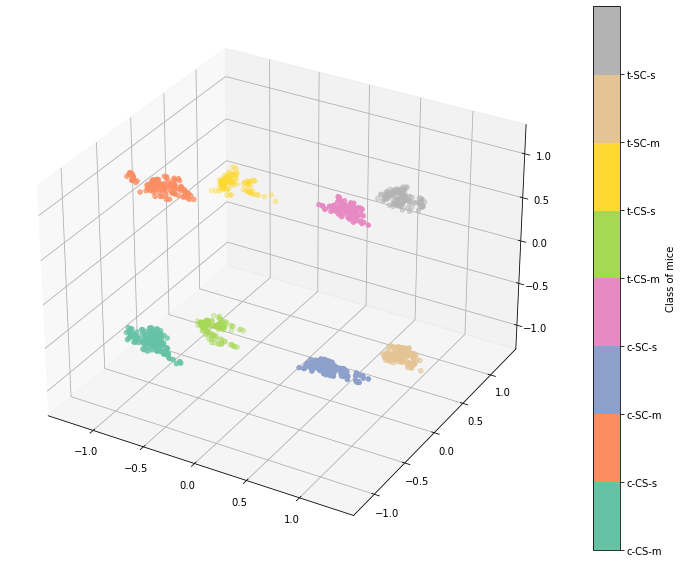

In [57]:
y_pred=pd.DataFrame(y_predict)
y_pred=y_pred[0].map({2:0,1:2,6:1,5:3,4:4,3:6,0:5,7:7}).to_numpy()

plot_3d(df_scaled, labels=y_pred, classes=['c-CS-m','c-CS-s','c-SC-m','c-SC-s','t-CS-m','t-CS-s','t-SC-m','t-SC-s'])

In [58]:
print(sklearn.metrics.jaccard_score(y, y_pred, average=None))
print(sklearn.metrics.jaccard_score(y, y_pred, average='weighted'))

[1. 1. 1. 1. 1. 1. 1. 1.]
1.0


In [59]:
print(correlation(df_scaled, y_predict, 'euclidean'))

0.4882587810923585


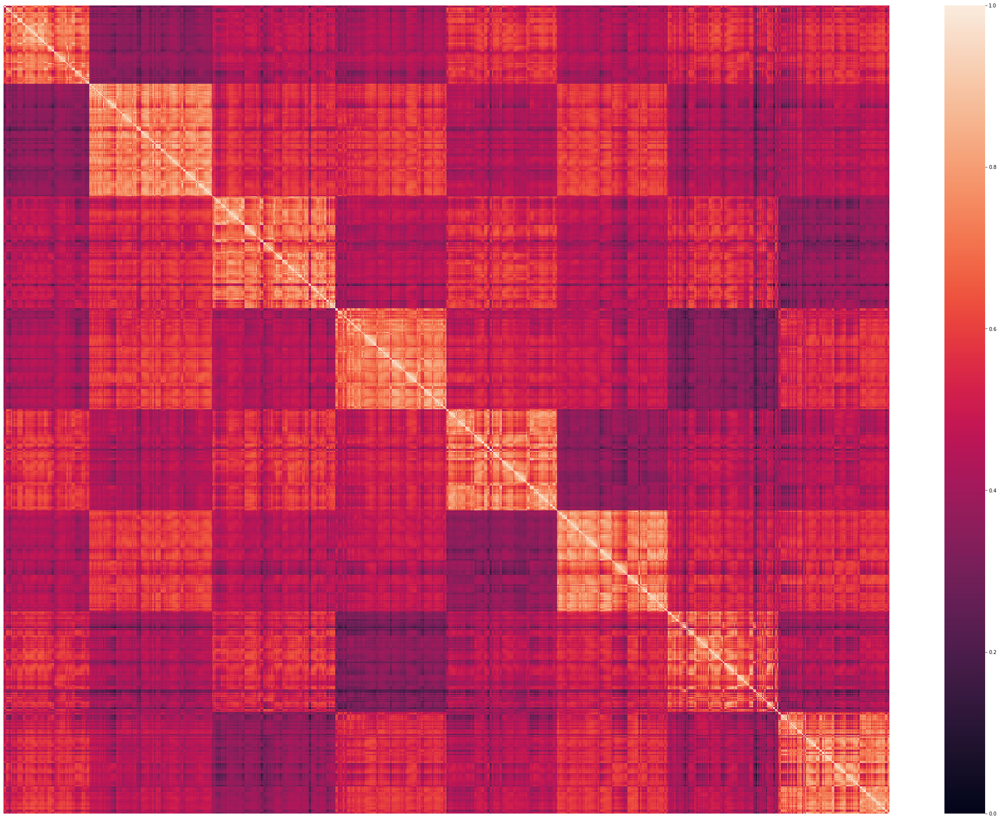

In [60]:
plot_sorted_mat(sim, y_predict)

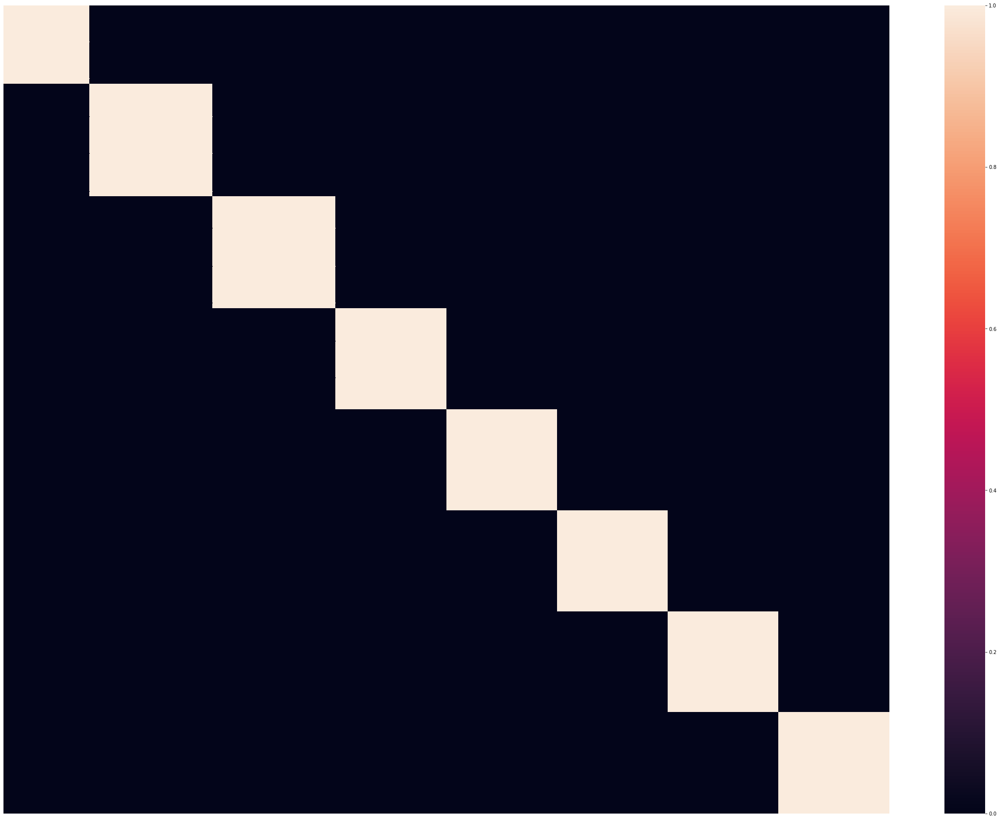

In [61]:
# Incidence matrix
inc = incidence_mat(y_predict)
plot_sorted_mat(inc, y_predict)

In [62]:
print("WSS", wss(df_scaled, y_predict, 'euclidean'))
print("BSS", bss(df_scaled, y_predict, 'euclidean'))

WSS 160648.55164997795
BSS 3241807.323631704


# KMedoids (PAM)

Kmeans is sensitive to outliers: **KMedoids (Partitioning Around Medoids)** uses the most centrally located point in a cluster, as a representative point of the cluster (uses medians instead of means, which is also an advantage if the mean can't be defined as with categorical data).

We expect the same excellent results of KMeans.

Kmedoids++ purity 0.9999999999259259
Kmedoids++ entropy -1.0686629926485829e-10


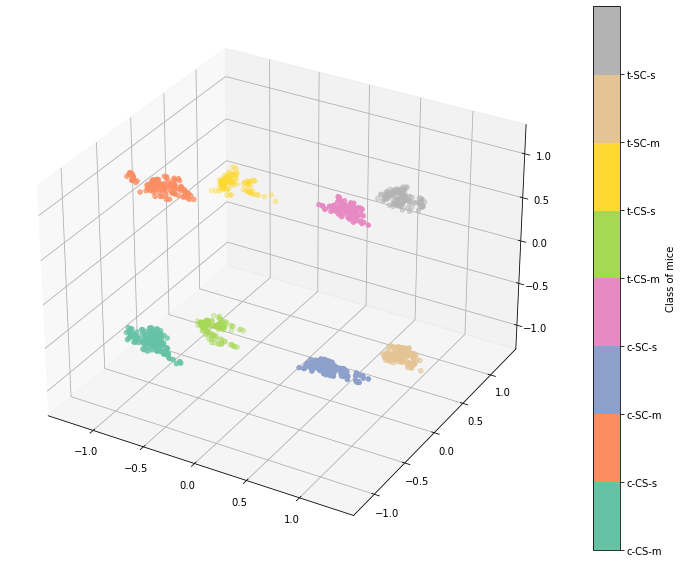

In [63]:
model = KMedoids(n_clusters=8, random_state=42, method='pam', init='k-medoids++')
# k-medoids++ follows an approach based on k-means++
model = model.fit(df_scaled)
y_predict = model.fit_predict(df_scaled)

y_pred=pd.DataFrame(y_predict)
y_pred=y_pred[0].map({2:0,1:2,6:1,5:3,4:4,3:6,0:5,7:7}).to_numpy()

plot_3d(df_scaled, labels=y_pred, classes=['c-CS-m','c-CS-s','c-SC-m','c-SC-s','t-CS-m','t-CS-s','t-SC-m','t-SC-s'])
print("Kmedoids++ purity", tot_purity(model.fit_predict(df_scaled), y))
print("Kmedoids++ entropy", tot_entropy(model.fit_predict(df_scaled), y))

In these cases, without categorical data (we one-hot encoded them), we prefer KMeans over KMedoids because of computational complexity:
- KMeans: $O(iKN)$, being $i$ := number of iterations;
- KMedoids: $O(i(N/K)^2)$ (quadratic in $N/K$ instead of linear in both).

# DBSCAN
**DBSCAN** is a very powerful algorithm for clustering based on the concept of density and connectivity. In general, it has three major advantages w.r.t. to the previous algorithms:
- it doesn't need to know the number of clusters in advantage;
- it can cluster arbitrary shapes;
- it is able to identify and handle outliers.

Given *eps* and *MinPts*, we define:
- **core point**: a point having at least *MinPts* points inside a radius of size *eps*. Can be retrieved with `model.core_sample_indices_`;
- **border point**: a point having fewer than *MinPts* in  *eps*, but it is inside the neighborhood of a core point;
- **noise point**: a point that is neither a core point nor a border point. Clustered with cluster id $-1$.

The algorithm starts with a random point *p* and retrieves all the points which are **density reachable** from *p*. If *p* is a core point the cluster is kept and the algorithm moves to the next unvisited point until all points have bees visited.

## How to choose Eps and MinPts?

We resort to gridsearch cross-validation to select a hyperparameters combination that maximizes a metric. We decided to use purity as a metric.

In [64]:
def make_scorer(metric):
    def scorer(estimator, X, y):
        y_pred = estimator.fit_predict(X)
        return metric(y_pred, y)
    return scorer

model = DBSCAN() # default: eps=0.5, min_samples=5, metric='euclidean'
params = {'eps': [.5,1,2], 'min_samples': range(5,15)}
cv = GridSearchCV(model, params, scoring=make_scorer(tot_purity), cv=3)
cv = cv.fit(df_scaled, y)

print(cv.best_params_)
print("CV purity score", tot_purity(cv.best_estimator_.fit_predict(df_scaled), y))
print("Entropy score", tot_entropy(cv.best_estimator_.fit_predict(df_scaled), y))

{'eps': 1, 'min_samples': 13}
CV purity score 0.9092592591851851
Entropy score -1.0686632937055941e-10


   -1    0    1   2    3    4    5   6    7
0  98  147  146  80  134  134  121  85  135


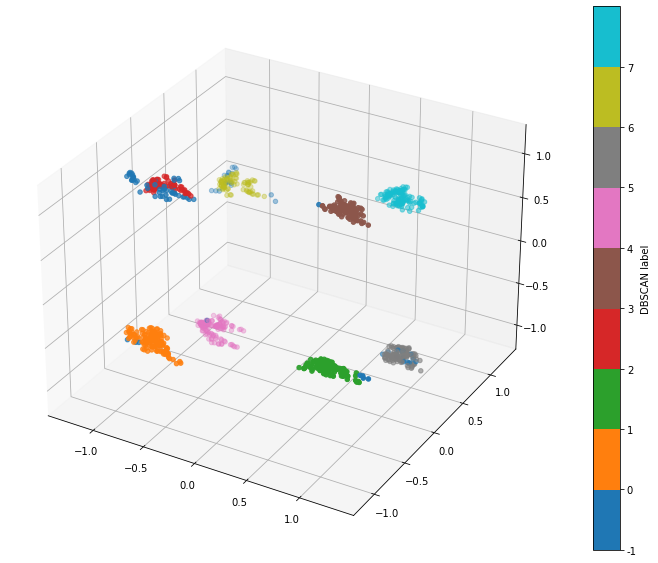

In [65]:
model = cv.best_estimator_ # eps=1, min_samples=13, metric='euclidean'
y_predict = model.fit_predict(df_scaled)

ids, counts = np.unique(y_predict, return_counts=True)
print(pd.DataFrame(counts.reshape(1,-1), columns=ids))

def plot3d(X, labels, mark, classes=[-1,0,1,2,3,4,5,6,7]):
    pca = PCA()
    X = pca.fit_transform(X)
    
    unique_labels = np.unique(labels)
    nlabels = len(unique_labels)
    fig = plt.figure(figsize=(15,10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define color mappings
    cmap = plt.cm.get_cmap('tab10', 9)
    smap = cm.ScalarMappable(
              norm=mcolors.Normalize(unique_labels.min(), unique_labels.max() + 1), 
              cmap=cmap)
    ax.scatter(xs=X[:, 0], ys=X[:, 1], zs=X[:, 2], c=labels, cmap=cmap)
    # Plot a color bar on the right
    cbar = plt.colorbar(mappable=smap, label=mark, ticks=range(nlabels))
    cbar.set_ticks([-1,0,1,2,3,4,5,6,7])
    cbar.ax.set_yticklabels(classes)
    

plot3d(df_scaled, labels=y_predict, mark='DBSCAN label')

Points belonging to $-1$ labeled cluster are noise. Apart from noise, the algorithm finds $8$ clusters as in hierachical and KMeans algorithms. DBSCAN results a little less precise in terms of purity because it adds a cluster for noise points (from the 3D plot we see inside cluster labeled $2$ we have a lot of points clustered into noise). In our specific case that is not really necessary because data were well cleaned in pre-processing steps, we already knew the best number of clusters is eight and we have well-defined in terms of shape clusters (3D plot using PCA shows that peculiarity).

We therefore expect a lower Jaccard score in cluster $2$ (and obviously a $0$ in noise points cluster because it does not exist in true clusters), let's verify this hypothesis.

In [66]:
y_pred=pd.DataFrame(y_predict)
y_pred=y_pred[0].map({-1:-1,0:0,1:2,2:1,3:3,4:4,5:6,6:5,7:7}).to_numpy()

print(sklearn.metrics.jaccard_score(y, y_pred, average=None))
print(sklearn.metrics.jaccard_score(y, y_pred, average='weighted'))

[0.         0.98       0.59259259 0.97333333 0.99259259 0.99259259
 0.80952381 0.8962963  1.        ]
0.9092592592592592


(NOTE: first value is related to noise points; third value - $0.59259259$ - is the one related to cluster 2 according to the true labelling order which is, as in map function's argument, $0,2,1,3,4,6,5,7$)

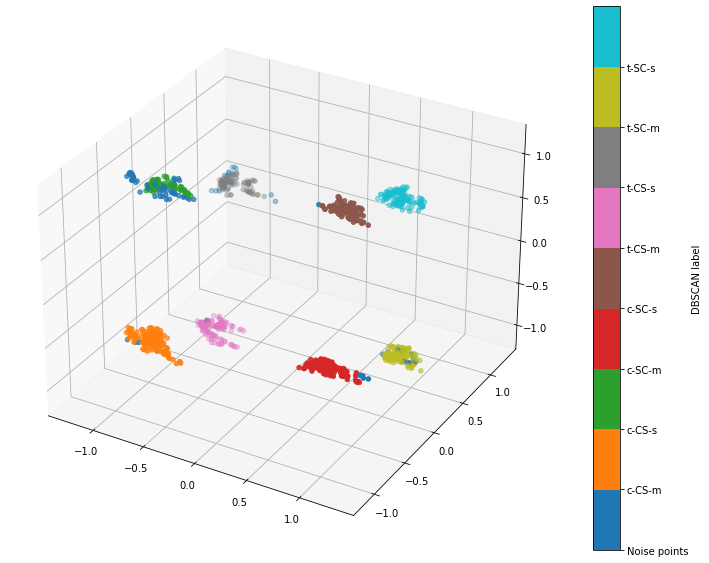

In [67]:
plot3d(df_scaled, labels=y_pred, mark='DBSCAN label',
       classes=['Noise points', 'c-CS-m','c-CS-s','c-SC-m','c-SC-s','t-CS-m','t-CS-s','t-SC-m','t-SC-s'])

In [68]:
print(correlation(df_scaled, y_predict, 'euclidean'))

0.4614749830058369


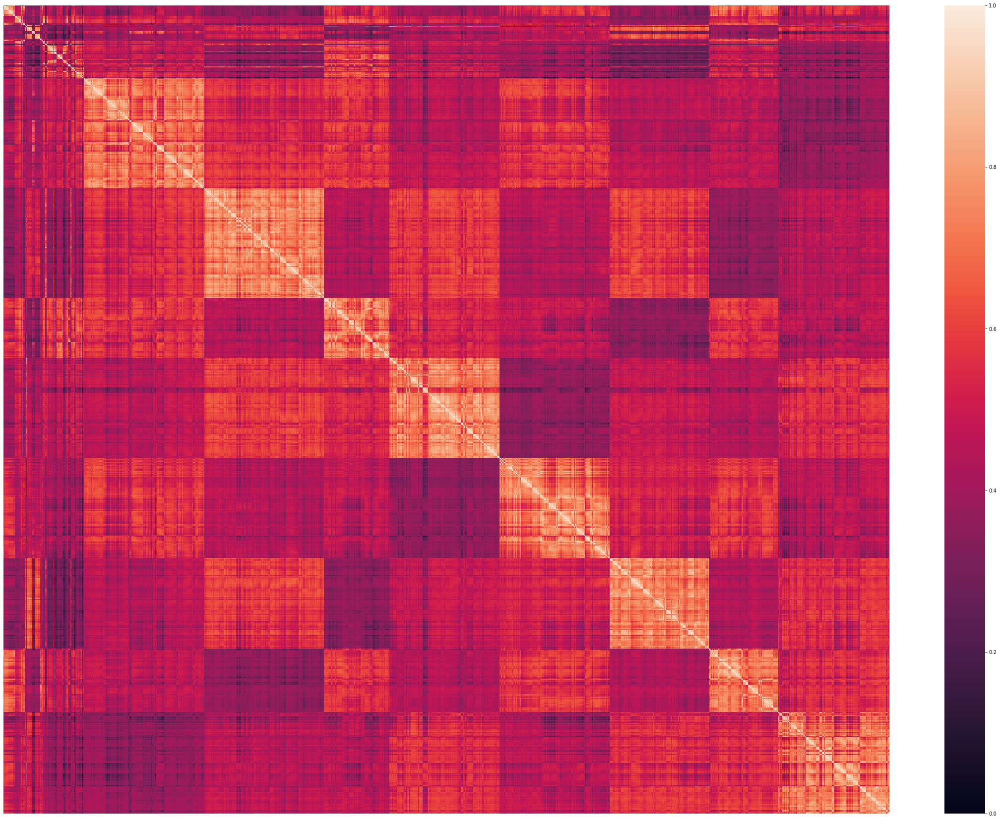

In [69]:
plot_sorted_mat(sim, y_predict)

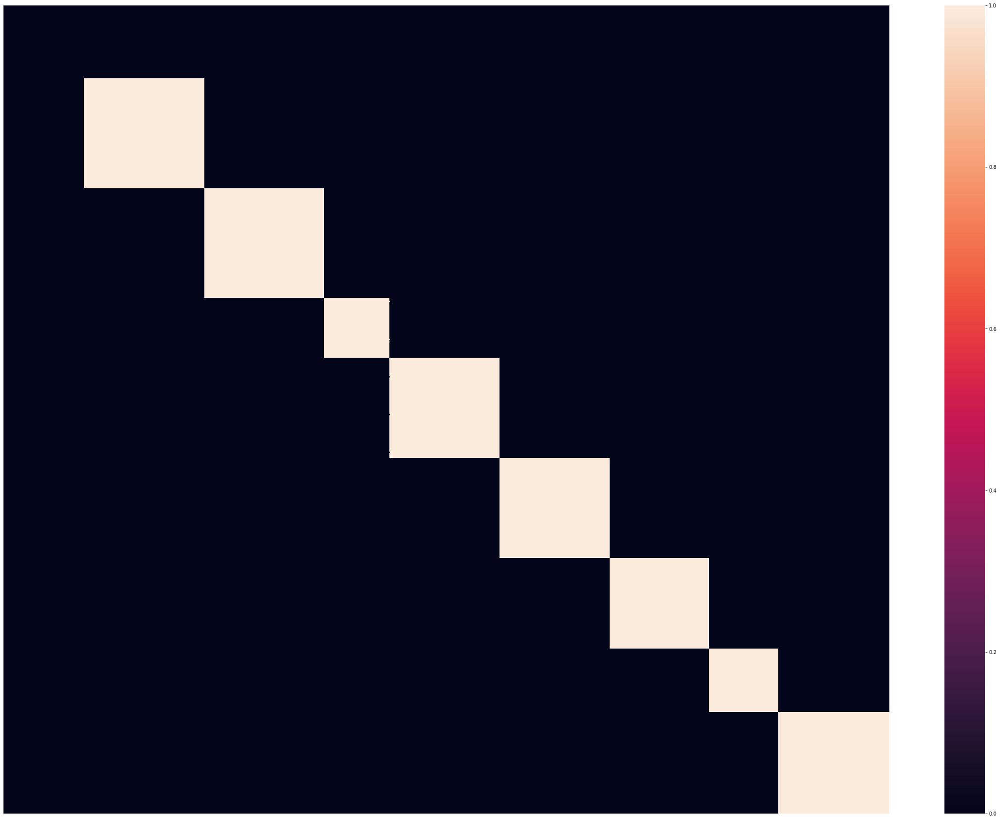

In [70]:
# Incidence matrix
inc = incidence_mat(y_predict)
plot_sorted_mat(inc, y_predict)

We can see in the similarity matrix a cluster in the top-left of the plot with little area and squared shape: this corresponds to cluster containing noise points.

As a consequence, the incidence matrix misses a square on the top left of the plot.

In [71]:
print("WSS", wss(df_scaled, y_predict, 'euclidean'))
print("BSS", bss(df_scaled, y_predict, 'euclidean'))

WSS 120954.34936388895
BSS 3281501.525917793


In [72]:
print("Silhoette Coefficient for DBSCAN (eps=1, MinPts=13) based on euclidean distance: ")
print(silhouette_score(df_scaled, y_predict, metric='euclidean'))

Silhoette Coefficient for DBSCAN (eps=1, MinPts=13) based on euclidean distance: 
0.28829617536694907


# OPTICS
Ordering Points To Identify the Clustering Structure (**OPTICS**) is an algorithm for finding density-based clusters in spatial data. OPTICS is an optimization of DBSCAN that addresses one of DBSCAN's major weaknesses: the problem of detecting meaningful clusters in data of varying density.

Like DBSCAN, OPTICS requires two parameters: *eps* and *MinPts*, describing the number of points required to form a cluster. In contrast to DBSCAN, OPTICS also considers points that are part of a more densely packed cluster, so each point is assigned a core distance that describes the distance to the *MinPts*th closest point.

In [73]:
model = OPTICS() # default: min_samples=5, metric='minkowski', xi=0.05

params = {'xi': [.01,.05,.5], 'min_samples': [35,40,45]}
cv = GridSearchCV(model, params, scoring=make_scorer(tot_purity), cv=2)
cv = cv.fit(df_scaled, y)

print(cv.best_params_)
print("CV purity score", tot_purity(cv.best_estimator_.fit_predict(df_scaled), y))
print("Entropy score", tot_entropy(cv.best_estimator_.fit_predict(df_scaled), y))

{'min_samples': 40, 'xi': 0.01}
CV purity score 0.9870370369629629
Entropy score -1.0686629629866692e-10


   -1    0    1    2    3    4    5    6    7
0  14  149  135  122  105  135  150  135  135


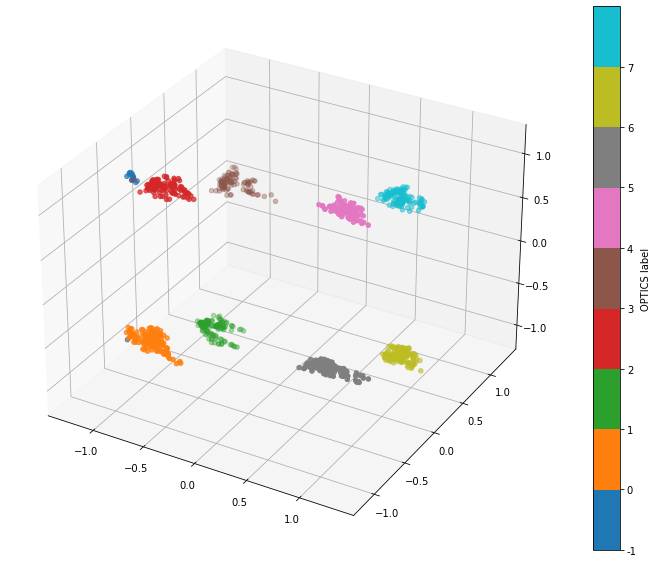

In [74]:
model = cv.best_estimator_ # min_samples=40, metric='minkowski', xi=0.01
y_predict = model.fit_predict(df_scaled)

ids, counts = np.unique(y_predict, return_counts=True)
print(pd.DataFrame(counts.reshape(1,-1), columns=ids)) # eventually index=['']

plot3d(df_scaled, labels=y_predict, mark='OPTICS label')

It again results with $8$ clusters, but this time noise is reduced and also more suitable w.r.t. our dataset if we look at the 3D plot: noise is concentrated in a little area not far detached from the red cluster numbered $2$ (less bulky than before).

As before we expect a Jaccard score of $0$ in noise points' cluster, but a value closer to $1$ than in DBSCAN in cluster $2$. 

In [75]:
pd.unique(y_predict)

array([ 0, -1,  5,  2,  4,  1,  6,  3,  7])

In [76]:
y_pred=pd.DataFrame(y_predict)
y_pred=y_pred[0].map({-1:-1,0:0,5:2,2:1,4:3,1:4,6:6,3:5,7:7}).to_numpy()

print(sklearn.metrics.jaccard_score(y, y_pred, average=None))
print(sklearn.metrics.jaccard_score(y, y_pred, average='weighted'))

[0.         0.99333333 0.9037037  1.         1.         1.
 1.         1.         1.        ]
0.987037037037037


$0.9037037$ $>>$ DBSCAN's $0.59259259$.

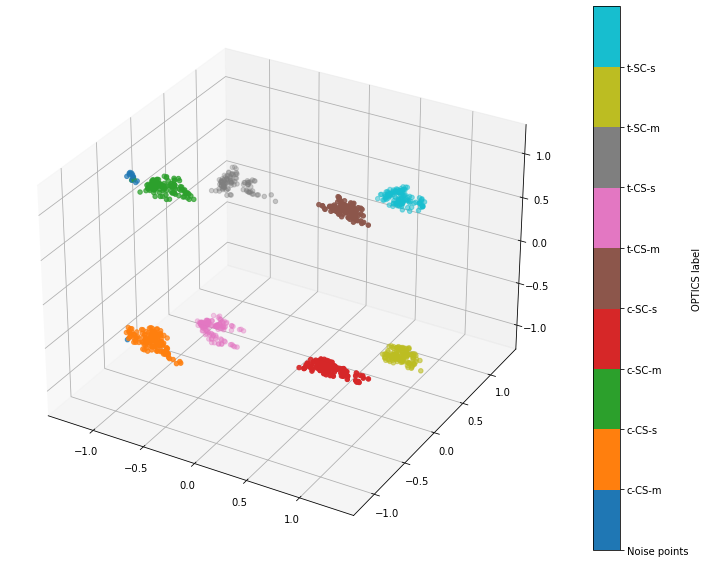

In [77]:
plot3d(df_scaled, labels=y_pred, mark='OPTICS label',
       classes=['Noise points', 'c-CS-m','c-CS-s','c-SC-m','c-SC-s','t-CS-m','t-CS-s','t-SC-m','t-SC-s'])

In [78]:
print(correlation(df_scaled, y_predict, 'euclidean'))

0.4851579120840116


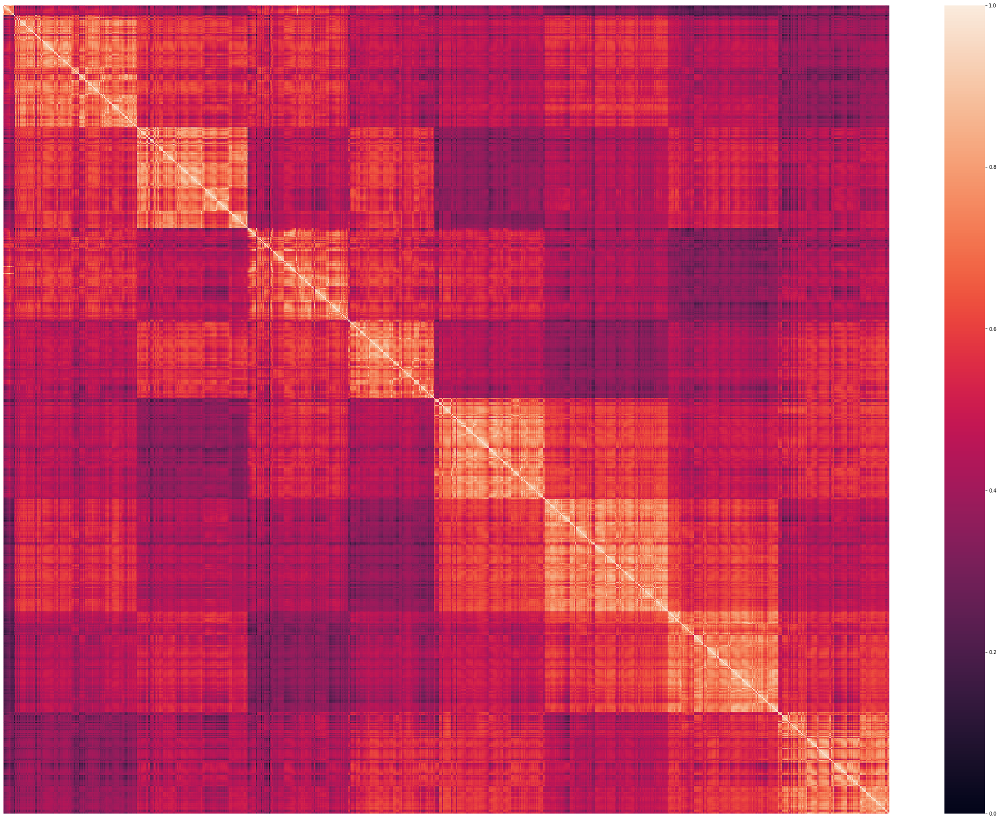

In [79]:
plot_sorted_mat(sim, y_predict)

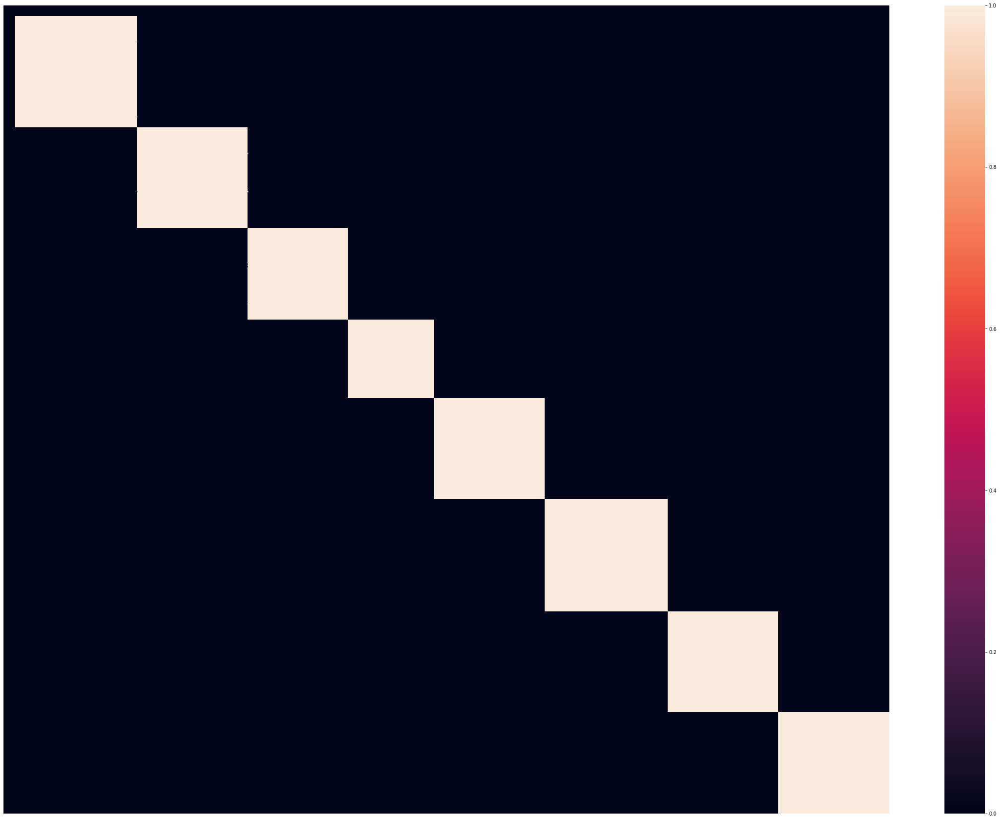

In [80]:
# Incidence matrix
inc = incidence_mat(y_predict)
plot_sorted_mat(inc, y_predict)

As before, we can see in the similarity matrices a cluster in the top-left of the plot with little area and squared shape: this corresponds to cluster containing noise points.

As a consequence, the incidence matrix misses a square on the top left of the plot, but the space left is less than in DBSCAN because we have less noise points.

In [81]:
print("WSS", wss(df_scaled, y_predict, 'euclidean'))
print("BSS", bss(df_scaled, y_predict, 'euclidean'))

WSS 151530.32342209565
BSS 3250925.5518595865


In [82]:
print("Silhoette Coefficient for OPTICS (eps=0.01, MinPts=40) based on euclidean distance: ")
print(silhouette_score(df_scaled, y_predict, metric='euclidean'))

Silhoette Coefficient for OPTICS (eps=0.01, MinPts=40) based on euclidean distance: 
0.32408686302295303


# SOM
In the original paper, the authors designed a strategy based on the unsupervised clustering method, **Self Organizing Maps (SOM)**, to identify biologically important differences in protein levels in mice exposed to context fear.

SOM consists of an artificial neural network algorithm that clusters multidimensional data and presents the result in a two dimensional projection or map of nodes. The number of clusters in the data is not specified a priori. SOM has proven to be a popular and powerful bioinformatics tool, in particular in analysis of gene expression data where the goal was to identify functional or regulatory similarities among genes with similar expression profiles.

The original paper states that SOM successfully clustered and discriminated classes of control mice based on with and without the stimulation to learn.

We try to resume this technique and compare it to the others.

In [83]:
model = SOM(m=8, n=1, dim=78, random_state=0) # 8 clusters --> 8 x 1 matrix
y_predict = model.fit_predict(df_scaled.to_numpy())
print("Purity score", tot_purity(y_predict, y))
print("Entropy score", tot_entropy(y_predict, y))

Purity score 0.9999999999259259
Entropy score -1.0686629926485829e-10


As in KMeans, let's properly encode the cluster ids, since it is useful to give correct names in the 3D plot and for computing the Jaccard score.

In [84]:
pd.unique(y)

[0, 2, 1, 3, 4, 6, 5, 7]
Categories (8, int64): [0, 2, 1, 3, 4, 6, 5, 7]

In [85]:
pd.unique(y_predict)

array([2, 3, 7, 6, 1, 4, 0, 5])

In [86]:
y_pred=pd.DataFrame(y_predict)
y_pred=y_pred[0].map({2:0,3:2,7:1,6:3,1:4,4:6,0:5,5:7}).to_numpy()

print(sklearn.metrics.jaccard_score(y, y_pred, average=None))
print(sklearn.metrics.jaccard_score(y, y_pred, average='weighted'))

[1. 1. 1. 1. 1. 1. 1. 1.]
1.0


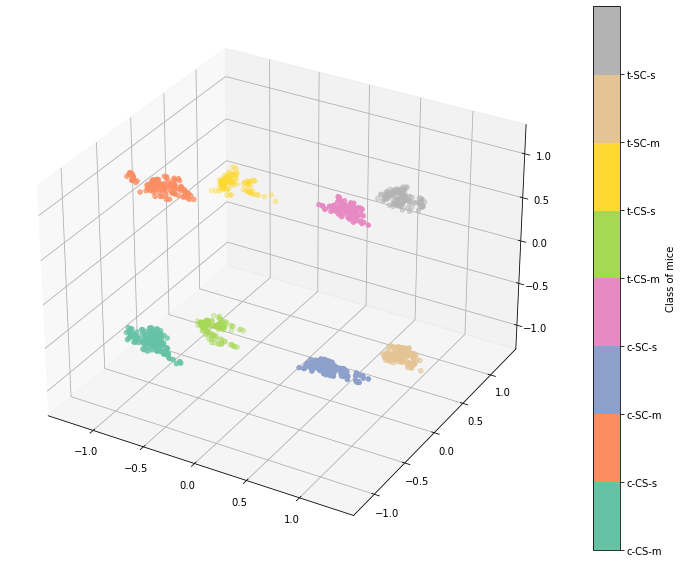

In [87]:
plot_3d(df_scaled, labels=y_pred, classes=['c-CS-m','c-CS-s','c-SC-m','c-SC-s','t-CS-m','t-CS-s','t-SC-m','t-SC-s'])

In [88]:
correlation(df_scaled, y_predict, 'euclidean')

0.4882587810923585

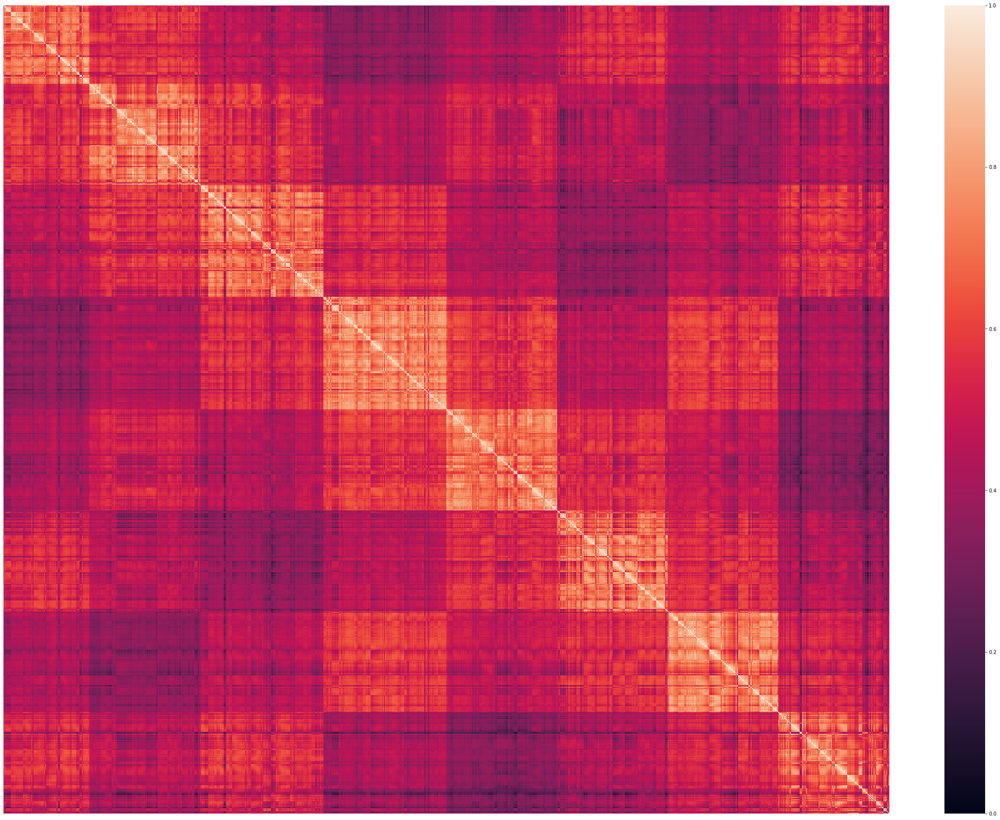

In [89]:
plot_sorted_mat(sim, y_predict)

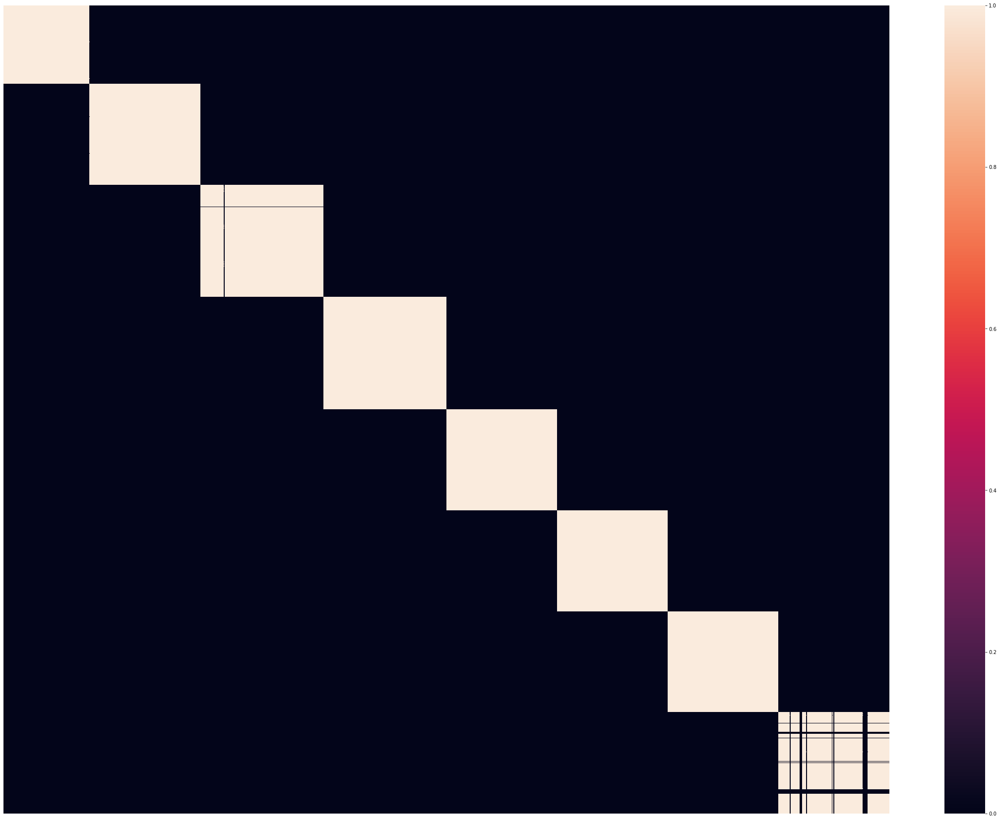

In [90]:
plot_sorted_mat(inc, y_predict)

In [91]:
print("WSS", wss(df_scaled, y_predict, 'euclidean'))
print("BSS", bss(df_scaled, y_predict, 'euclidean'))

WSS 160648.55164997795
BSS 3241807.323631704


In [92]:
print("Silhoette Coefficient for SOM (8x1) based on euclidean distance: ")
print(silhouette_score(df_scaled, y_predict, metric='euclidean'))

Silhoette Coefficient for SOM (8x1) based on euclidean distance: 
0.3197782652626225


$8x1$ SOM performs very similar (almost identically) to KMeans.

In the original paper, the authors chose SOM to identify peculiarity of subclusters. It can be easily done changing SOM's matrix shape, for example:

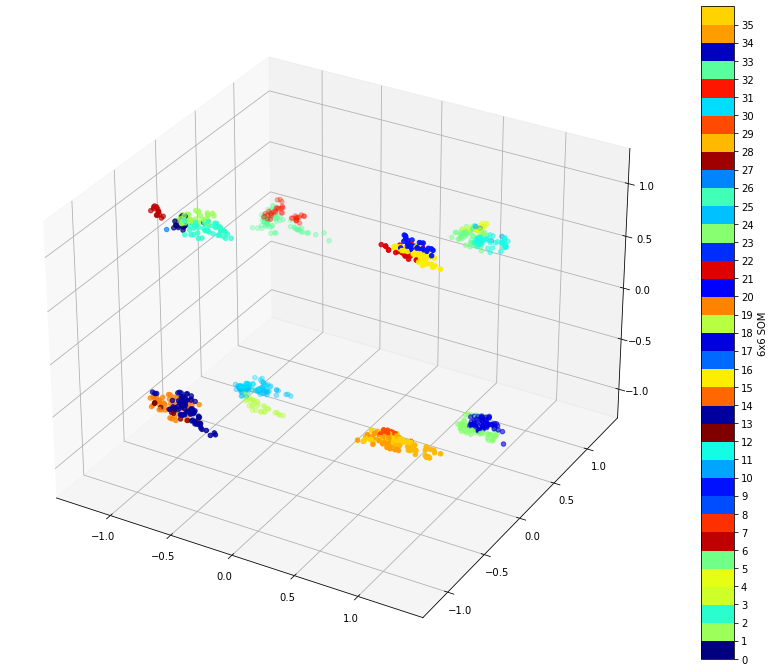

In [93]:
model = SOM(m=6, n=6, dim=78, random_state=0) # 6 x 6 matrix --> 36 clusters
y_predict = model.fit_predict(df_scaled.to_numpy())

def plot3d(X, labels, mark):
    pca = PCA()
    X = pca.fit_transform(X)
    
    unique_labels = np.unique(labels)
    nlabels = len(unique_labels)
    fig = plt.figure(figsize=(15,12))
    ax = fig.add_subplot(111, projection='3d')
    
    # Define color mappings
    vals = np.linspace(0,1,36)
    random.Random(0).shuffle(vals)
    cmap = plt.cm.colors.ListedColormap(plt.cm.jet(vals))
    smap = cm.ScalarMappable(
              norm=mcolors.Normalize(unique_labels.min(), unique_labels.max() + 1), 
              cmap=cmap)
    ax.scatter(xs=X[:, 0], ys=X[:, 1], zs=X[:, 2], c=labels, cmap=cmap)
    # Plot a color bar on the right
    cbar = plt.colorbar(mappable=smap, label=mark, ticks=range(nlabels))
    cbar.set_ticks(range(36))
    
plot3d(df_scaled, labels=y_predict, mark='6x6 SOM')

Interestingly, subclusters are always well-defined in terms of shape (points of the same color are close one each other).

# Final comparison and considerations

We already saw KMeans, SOM and Hierarchical clustering performed best on our dataset in terms of purity, while DBSCAN and OPTICS lack a bit because they consider an additional cluster containing noise points. Nevertheless, OPTICS gains a little in terms of silhouette coefficient identifying also possible outliers (noise points).
All algorithms seen are valid (see similar performances also below), the final choice should be related to the aim of the clustering model: KMeans and hierarchical perform similar but the second one is more interpretable and informative due to the hierarchical clustering’s dendrogram; OPTICS can be useful because it identifies some probable little noise left in the dataset (also gains a little in terms of silhouette score); SOM can be used to easily identify subclusters.

Agglomerative ==> Purity 1.0000, Correlation 0.4883, WSS 160649, BSS 3241807, Silhouette 0.3198, Entropy -1.1E-10
KMeans ==> Purity 1.0000, Correlation 0.4883, WSS 160649, BSS 3241807, Silhouette 0.3198, Entropy -1.1E-10
8x1 SOM ==> Purity 1.0000, Correlation 0.4883, WSS 160649, BSS 3241807, Silhouette 0.3198, Entropy -1.1E-10
DBSCAN ==> Purity 0.9093, Correlation 0.4615, WSS 120954, BSS 3281502, Silhouette 0.2883, Entropy -1.1E-10
OPTICS ==> Purity 0.9870, Correlation 0.4852, WSS 151530, BSS 3250926, Silhouette 0.3241, Entropy -1.1E-10


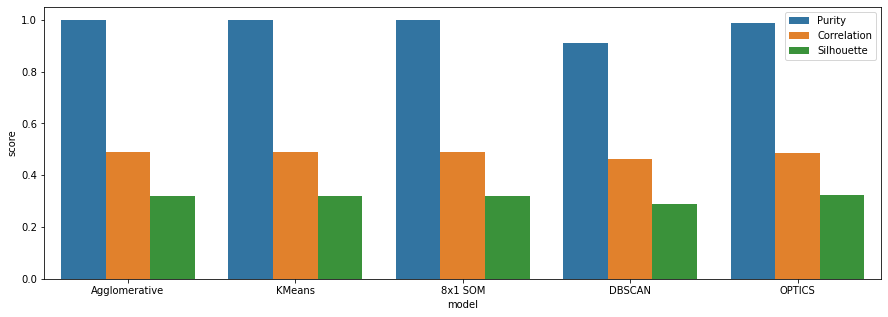

In [94]:
agglomerative = AgglomerativeClustering(n_clusters=8)
Kmeans = KMeans(n_clusters=8, init='k-means++', random_state=42)
# Kmedoids = KMedoids(n_clusters=8, random_state=42, method='pam', init='k-medoids++')
DbSCAN = DBSCAN(eps=1, min_samples=13)
OpTICS = OPTICS(xi=0.01, min_samples=40)
sOm = SOM(m=8, n=1, dim=78, random_state=0)

models = OrderedDict([('Agglomerative', agglomerative), ('KMeans', Kmeans),
                      ('8x1 SOM', sOm), ('DBSCAN', DbSCAN), ('OPTICS', OpTICS)])

correlation_scores, WSS_scores, BSS_scores, purity_scores, silhouette_scores, entropy_scores =\
    [], [], [], [], [], []
for name, model in models.items():
    y_predict = model.fit_predict(df_scaled.to_numpy())
    pUrity = tot_purity(y_predict, y)
    purity_scores.append(pUrity)
    cOrrelation = correlation(df_scaled, y_predict, 'euclidean')
    correlation_scores.append(cOrrelation)
    WSS = wss(df_scaled, y_predict, 'euclidean')
    WSS_scores.append(WSS)
    BSS = bss(df_scaled, y_predict, 'euclidean')
    BSS_scores.append(BSS)
    silhouette = silhouette_score(df_scaled, y_predict, metric='euclidean')
    silhouette_scores.append(silhouette)
    entrOpy = tot_entropy(y_predict, y)
    entropy_scores.append(entrOpy)
    print("{} ==> Purity {:.4f}, Correlation {:.4f}, WSS {:.0f}, BSS {:.0f}, Silhouette {:.4f}, Entropy {:.1E}"\
          .format(name, pUrity, cOrrelation, WSS, BSS, silhouette, entrOpy))

data = pd.DataFrame()
data['model'] = list(models.keys()) * 3
data['metric'] = ['Purity'] * len(purity_scores) + ['Correlation'] * len(correlation_scores) +\
                 ['Silhouette'] * len(silhouette_scores)
data['score'] = purity_scores + correlation_scores + silhouette_scores
plt.figure(figsize=(15,5))
_ = sns.barplot(x='model', y='score', data=data, hue='metric')
_ = plt.legend(loc='upper right')